FAO_LivestockFish_CommodityBalance

# Pre-Load

### Libraries and Settings

In [1]:
"""Modules"""

import urllib.request, urllib.parse, urllib.error
import requests
from bs4 import BeautifulSoup

import lxml
import re
import os
import time
import datetime
import chardet
import zipfile
from zipfile import ZipFile
import json
from io import BytesIO

from IPython.display import display

import matplotlib.pyplot as plt
import matplotlib.transforms
%matplotlib inline

import folium
from PIL import Image

import numpy as np
import pandas as pd

pd.set_option('precision', 4)
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',500)
pd.set_option('max_colwidth',100)

def curl(url,path,mode='wb'):
    response = urllib.request.urlopen(url).read()
    with open(path, mode) as handle:
        handle.write(response)

In [2]:
# path_img = './results/FAO_LivestockFish_CommodityBalance/img/'
# path_map = './results/FAO_LivestockFish_CommodityBalance/img/'
# for path in [path_img, path_map]:
#     for i in os.listdir(path):
#         path_file = os.path.join(path,i)  
#         if os.path.isfile(path_file):
#               os.remove(path_file)

### Variables

In [3]:
"""小写开头的字母用于临时变量"""

# data -- 用于创建表格的临时数据，创建完后必须赋值给永久变量
# df   -- 用于画图的临时数据，画图时将所需数据赋值给它
# dfs  -- 用于画图的临时数据字典，画图时将所需数据赋值给它
# domain
# 其他小写字母


"""初始化全局变量，请小心操作"""

# 用户自定义参数，会随着用户设置的变化而变化
D = ''    # Domain
A = ''    # Area     单一的国家/地区，
As = []
E = ''    # Element
Es = []
I = ''    # A paticular Item
Is = []   # Items

# 根据用户变量生成
DFs = {}        # 每个 Domain 的所有数据是一份 DF，keys=Domains，no index, columns=['Area Code', 'Area', 'Element', 'Item', 'Year', 'Unit', 'Value']
CDTs = {}       # 从DFs筛选数据的条件，key0=Domain, key1=Area, key2=Element, value=Items
PVs_AreaYear = {}        # 从DFs根据筛选条件生成的 DICT, key0=Domain, key1=Area, key2=Element, key3=Items, values=DF, index=Areas, columns=Years
PVs_YearArea = {}        # 从DFs根据筛选条件生成的 DICT, key0=Domain, key1=Area, key2=Element, key3=Items, values=DF, index=Years, columns=Areas

Years = []      # 年份列表

PVs_AG = {}     # 某国家地区与其所在组合的某些 Items 的比较，key0=Domain, key1=Area, key2=Element, key3=[AG, A, G], index=Years, columns=[C,G]

# 必要的信息 
DOMs = {}        # Domain 的描述字典， key=domain_name(file name's pref)
LIST_countries=[]  # 国家级地区列表，Area Code < 5000, default refer to  worlds contries
LIST_groups=[]    # 地区组合列表，Area Code >= 5000, default grouped by continents


""" DIRECTOR SETTINGS"""

FAO_DOWNLOADS_ROOT = 'http://fenixservices.fao.org/faostat/static/bulkdownloads/'
FAO_DOWNLOADS_XML = os.path.join(FAO_DOWNLOADS_ROOT, 'datasets_E.xml')
FAO_DOWNLOADS_JSON = os.path.join(FAO_DOWNLOADS_ROOT, 'datasets_E.json')
FAO_DOWNLOADS_BULK = os.path.join(FAO_DOWNLOADS_ROOT, 'FAOSTAT.zip')

print(f'FAOSTAT downloads root: {FAO_DOWNLOADS_ROOT}')
print(f'FAOSTAT description in .xml: {FAO_DOWNLOADS_XML}')
print(f'FAOSTAT description in .json: {FAO_DOWNLOADS_JSON}')
print(f'FAOSTAT downloads .zip: {FAO_DOWNLOADS_BULK}')

# what is the relevent path of root
root_where = '../../'
print('+++++++++ Atention ++++++++++')
print(f'The root is set as "{root_where}" relevent to this file.' )
print(f'If it is not right, you change this parameter where the parameter name is "root_where".' )
print('+++++++++++++++++++++++++++++')

LOCAL_ROOT = os.path.abspath(root_where)
DATA_BASE = os.path.join(LOCAL_ROOT, 'data')
print(f'Root director: {LOCAL_ROOT}')
print(f'Data director: {DATA_BASE}')

DATA_FAO = os.path.join(DATA_BASE, 'FAO')
FAO_meta = os.path.join(DATA_FAO, 'metadata')
FAO_description_path = FAO_meta + '/datasets_E.xml'
FAO_BULK_zip = DATA_FAO + '/FAOSTAT.zip'
print(f'FAO data director: {DATA_FAO}')
print(f'FAO metadata director: {FAO_meta}')
print(f'FAO local description file: {FAO_description_path}')
print(f'FAO local datasets zip: {FAO_BULK_zip}')

SUFFIX = '_E_All_Data_(Normalized)'  # suffix of fao data file name
print(f'Suffix of raw FAO data file name: {SUFFIX}')


# DATA_NBS = os.path.join(DATA_BASE, 'NBS')
# DATA_hybrids = os.path.join(DATA_BASE, 'hybrids')

# print(f'NBS data director: {DATA_NBS}')
# print(f'Datasets hybrids director: {DATA_hybrids}')

FAOSTAT downloads root: http://fenixservices.fao.org/faostat/static/bulkdownloads/
FAOSTAT description in .xml: http://fenixservices.fao.org/faostat/static/bulkdownloads/datasets_E.xml
FAOSTAT description in .json: http://fenixservices.fao.org/faostat/static/bulkdownloads/datasets_E.json
FAOSTAT downloads .zip: http://fenixservices.fao.org/faostat/static/bulkdownloads/FAOSTAT.zip
+++++++++ Atention ++++++++++
The root is set as "../../" relevent to this file.
If it is not right, you change this parameter where the parameter name is "root_where".
+++++++++++++++++++++++++++++
Root director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas
Data director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data
FAO data director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data/FAO
FAO metadata director: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data/FAO/metadata
FAO local description file: /mnt/sda2/_hub/projects/GoodFood/meat-atlas/data/FAO/metadata/datasets_E.xml
FAO local datasets zip: /mnt/sda2

### Meta Data

In [4]:
def FAO_description_dic(soup):
    """
    input soup parsed by bs4
    parse it to dict with nessesary info
    """
    dic = {}
    for dataset in soup.find_all('Dataset'):
        file_loc = dataset.FileLocation.string
        domain = file_loc[file_loc.find('bulkdownloads/')+len('bulkdownloads/'):file_loc.find('_E_All')]
        dic[domain] = {'DatasetCode': dataset.DatasetCode.string,
                        'DatasetName': dataset.DatasetName.string,
                        'Topic': dataset.Topic.string,
                        'DatasetDescription': dataset.DatasetDescription.string,
                        'MedaData': [dataset.Contact.string, dataset.Email.string, dataset.DateUpdate.string, dataset.CompressionFormat.string, dataset.FileType.string, dataset.FileSize.string, dataset.FileRows.string],
                        'Url_Normalized':dataset.FileLocation.string}
    return dic

In [5]:
""" If you need to update, uncomment this cell. """
# # Download or update FAOSTAT datasets if necessary
# if os.path.exists(FAO_description_path) or os.path.exists(FAO_BULK_zip): pass
# else: 
#     print('Need to download or update FAOSTAT datasets.')
#     print('Processing ...')
#     curl(url=FAO_DOWNLOADS_XML, path=FAO_description_path)
#     curl(url=FAO_DOWNLOADS_BULK, path=FAO_BULK_zip)
    
# # Check local datasets update  
# print('Checking updates ...')

# # local datasets
# print('Checking Local description ...')
# with open(FAO_description_path, 'rb') as handle:
#     xml = handle.read()
#     soup = BeautifulSoup(xml, 'xml')
# xml_local = FAO_description_dic(soup)

# # online datasets
# print('Checking latest description ...')
# response = requests.get(FAO_DOWNLOADS_XML)
# xml = response.content
# soup = BeautifulSoup(xml, 'xml')
# xml_online = FAO_description_dic(soup)

# # compare
# print('Comparing ...')
# shared_items = {k: xml_local[k] for k in xml_local if k in xml_online and xml_local[k] == xml_online[k]}
# need_update = {k: xml_local[k] for k in xml_local if xml_local[k] != xml_online[k]}
# update_to = {k: xml_local[k] for k in xml_local if xml_local[k] != xml_online[k]}

# print('No. of local datasets: ', len(xml_local))
# print('No. of latest datasets: ', len(xml_online))
# print('No. of shared datasets: ', len(shared_items))

# if len(xml_local)==len(shared_items) and len(xml_local)==len(xml_online):
#     print ('Already up to date.')
# else:
#     print('Need update: ', need_update)
#     print('Update to: ', update_to)
#     print("NOTE: If you don't concern about datasets listed above, there's no need to update!")
    
# print('Done succesfully.')

' If you need to update, uncomment this cell. '

In [6]:
with open(FAO_description_path, 'rb') as handle:
    xml = handle.read()
    soup = BeautifulSoup(xml, 'xml')
DOMs = FAO_description_dic(soup)
# display(DOMs)

# 加载国家列表
LIST_countries = []
with open(FAO_meta+'/list_countries_world.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_countries.append(line)
LIST_countries.remove('China')  # Because we use `China, mainland`
print(f'There are {len(LIST_countries)} countries.')
# display(LIST_countries)

# 加载区域/组合列表
LIST_groups = []
with open(FAO_meta+'/list_groups_world.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_groups.append(line)
COUNT_groups = len(LIST_groups)
print(f'There are {len(LIST_groups)} groups.')
# display(LIST_groups)

# 自定义常用区域/组合列表
# OECD
LIST_countries_OECD = []
with open(FAO_meta+'/list_countries_OECD.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_countries_OECD.append(line)
print(f'There are {len(LIST_countries_OECD)} OECD countries.')
# display(LIST_countries_OECD)

# Asia
LIST_countries_asia = []
with open(FAO_meta+'/list_countries_asia.txt', 'r') as handle:
    for line in handle.readlines():
        line=line.strip()
        LIST_countries_asia.append(line)
print(f'There are {len(LIST_countries_asia)} Asian countries.')
# display(LIST_countries_asia)

There are 225 countries.
There are 34 groups.
There are 36 OECD countries.
There are 53 Asian countries.


### Plot Style

In [7]:
plt.style.use(['ggplot'])

# font size
TIT_size = 13    # titles
LAB_size = 10    # labels
LEG_size = 10    # legends
TCK_size = 10    # ticklabels

LIN_wei = 1.5    # line weights
BAR_wid = 4      # bar width
GRD_wid = 0.5    # grid line width
GRD_clr = 'white' 
GRD_aph = 1     # grid alpha

CLs = ('#ffab91','#c62828','#689f38','#ff6f00','#8c9eff','#ffc400','#283593',)
       
MKs = ('o', 'x','o','x', 'v','.','v','.','o','x','o', 'x', 'v','.','v','.')
LSs = ('-','-','--', ':', ':','-.','-.','-','-','--','--', ':', ':','-.','-.')

# =============================================================================================================
def setX_quant(ax, ticks, step, label = ''):
    ax.set_xticks(ticks)
    ax.set_xlim(ticks[0]-step/2,ticks[-1]+step/2)
    ax.set_xticklabels(ticks, rotation=0, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setX_quali(ax, ticks, label = ''):
    ax.set_xticklabels(ticks, rotation=90, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

def setY_quant(ax, y_max, label = ''):
    tick_num = 9
    step = y_max/(tick_num-1)
    min_gap = 10
    
    if step < 1:
        step = round(step,1)
        dec=1
    elif step < 10:
        step = int(step)
        dec=0
    elif step/min_gap < 10:
        step = int(step/min_gap)*10
        dec=0
    else:
        n=0
        while step/min_gap >= 10:
            step = int(step/min_gap)
            n += 1
        step = int(step/min_gap)*(min_gap**(n+1))
        dec=0
        
    y_max = step*(tick_num+1)        
    ticks = np.round(np.arange(0, y_max+step, step),decimals=dec)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1]+step)
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel(label, fontsize=LAB_size)    
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setY_per(ax):
    ticks=np.round(np.linspace(0, 100, num=11, endpoint=True), decimals=0)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel('Percentage (%)', fontsize=LAB_size)
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

## Setting Variables

In [8]:
def rdDF(domain):
    
    display(DOMs[domain])
    
    zf = ZipFile(f'{DATA_FAO}/{domain}{SUFFIX}.zip')
    encodings = ["ISO-8859-1", "UTF-8", "UTF-8-SIG", "GBK"]
    for encoding in encodings:
        try:
            data = pd.read_csv(zf.open(f'{domain}{SUFFIX}.csv'), encoding=encoding)
        except:
            pass
    
    display(data.head())
    display(data.tail())

    return data

### Domain Selection - 'CommodityBalances_LivestockFish'

In [9]:
# 给 Domain 赋值，查看数据基础信息
D = 'CommodityBalances_LivestockFish'

In [10]:
""" Check update information if you've run update cell before, and if the domain has been updated , uncomment this cell. """
# with ZipFile(FAO_BULK_zip, 'r') as zf1:
#     zf1.extract(f'{D}{SUFFIX}.zip', DATA_FAO)      

" Check update information if you've run update cell before, and if the domain has been updated , uncomment this cell. "

In [11]:
# Show you raw data
DATA = rdDF(D)
print('data shape: ', DATA.shape)

{'DatasetCode': 'BL',
 'DatasetName': 'Food Balance: Commodity Balances - Livestock and Fish Primary Equivalent',
 'Topic': 'Most crop and livestock products, including processed products, under agricultural activity.',
 'DatasetDescription': 'Food supply data is some of the most important data in FAOSTAT. In fact, this data is for the basis for estimation of global and national undernourishment assessment, when it is combined with parameters and other data sets. This data has been the foundation of food balance sheets ever since they were first constructed. The data is accessed by both business and governments for economic analysis and policy setting, as well as being used by the academic community.',
 'MedaData': ['Mr. Salar Tayyib',
  'faostat@fao.org',
  '2018-01-17',
  'zip',
  'csv',
  '16605KB',
  '2868088'],
 'Url_Normalized': 'http://fenixservices.fao.org/faostat/static/bulkdownloads/CommodityBalances_LivestockFish_E_All_Data_(Normalized).zip'}

,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
0,2,Afghanistan,2731,Bovine Meat,5510,Production,1961,1961,tonnes,43000.0,S
1,2,Afghanistan,2731,Bovine Meat,5510,Production,1962,1962,tonnes,45800.0,S
2,2,Afghanistan,2731,Bovine Meat,5510,Production,1963,1963,tonnes,47250.0,S
3,2,Afghanistan,2731,Bovine Meat,5510,Production,1964,1964,tonnes,48000.0,S
4,2,Afghanistan,2731,Bovine Meat,5510,Production,1965,1965,tonnes,48700.0,S


,Area Code,Area,Item Code,Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
2459786,5817,Net Food Importing Developing Countries,2945,Offals,5153,Other uses,2009,2009,tonnes,43075.0,A
2459787,5817,Net Food Importing Developing Countries,2945,Offals,5153,Other uses,2010,2010,tonnes,25138.0,A
2459788,5817,Net Food Importing Developing Countries,2945,Offals,5153,Other uses,2011,2011,tonnes,27344.0,A
2459789,5817,Net Food Importing Developing Countries,2945,Offals,5153,Other uses,2012,2012,tonnes,26644.0,A
2459790,5817,Net Food Importing Developing Countries,2945,Offals,5153,Other uses,2013,2013,tonnes,35772.0,A


data shape:  (2459791, 11)


### Show Years Range

In [12]:
# 查看数据 Years 范围
Years = DATA['Year'].unique()
print(f'Dataset years range: {Years[0]} ~ {Years[-1]}')

# 定义 Years 分析范围
# Years = range(1961,2019+1)
print(f'You choose years range: {Years[0]} ~ {Years[-1]}')

DATA = DATA[DATA['Year'].isin(Years)]

Dataset years range: 1961 ~ 2013
You choose years range: 1961 ~ 2013


In [13]:
# 选择列
COLUMNS = ['Area Code', 'Area', 'Element', 'Item', 'Year', 'Unit', 'Value']

DATA = DATA[COLUMNS]
print('data shape: ', DATA.shape)

# 去空值和重复值（不是必须的，检查 data shape）
DATA = DATA.dropna().drop_duplicates()
print('data shape after drop Non. and Dup.: ', DATA.shape)

# 查看数据构成
print('Groupe data by Elements and Items: ')
display(DATA.groupby(['Element','Item']).count())

data shape:  (2459791, 7)
data shape after drop Non. and Dup.:  (2296529, 7)
Groupe data by Elements and Items: 


Area Code   Area  \
Element                       Item                                        
Domestic supply quantity      Animal fats                  10340  10340   
                              Aquatic Animals, Others       8301   8301   
                              Aquatic Plants                9705   9705   
                              Aquatic Products, Other       9925   9925   
                              Bovine Meat                  10340  10340   
                              Butter, Ghee                 10340  10340   
                              Cephalopods                  10168  10168   
                              Cheese                       10287  10287   
                              Cream                         9578   9578   
                              Crustaceans                  10285  10285   
                              Demersal Fish                10287  10287   
                              Eggs                         10434  10434   
                              Fats, Animals, Raw           10340  10340   
                              Fish Meal                    10019  10019   
                              Fish, Body Oil                9573   9573   
                              Fish, Liver Oil               8883   8883   
                              Fish, Seafood                10340  10340   
                              Freshwater Fish              10340  10340   
                              Hides and skins              10181  10181   
                              Honey                        10075  10075   
                              Marine Fish, Other           10234  10234   
                              Meat                         10340  10340   
                              Meat Meal                     9027   9027   
                              Meat, Aquatic Mammals          424    424   
                              Meat, Other                  10340  10340   
                              Milk - Excluding Butter      10511  10511   
                              Milk, Skimmed                10287  10287   
                              Milk, Whole                  10340  10340   
                              Molluscs, Other              10253  10253   
                              Mutton & Goat Meat           10340  10340   
                              Offals                       10340  10340   
                              Offals, Edible               10340  10340   
                              Pelagic Fish                 10287  10287   
                              Pigmeat                      10234  10234   
                              Poultry Meat                 10340  10340   
                              Silk                          6929   6929   
                              Whey                          9389   9389   
                              Wool (Clean Eq.)              7905   7905   
Export Quantity               Animal fats                   9629   9629   
                              Aquatic Animals, Others       5752   5752   
                              Aquatic Plants                6807   6807   
                              Aquatic Products, Other       7602   7602   
                              Bovine Meat                   9448   9448   
                              Butter, Ghee                  8665   8665   
                              Cephalopods                   8297   8297   
                              Cheese                        8526   8526   
                              Cream                         6877   6877   
                              Crustaceans                   9636   9636   
                              Demersal Fish                 9181   9181   
                              Eggs                          8453   8453   
                              Fats, Animals, Raw            8312   8312   
                              Fish Meal                     9154   9154   
     

### Area Selection

In [14]:
# Countries available
Areas = DATA['Area'].unique()
Countries = [c for c in LIST_countries if c in Areas]
print('Chountries available in this domain:')
print(Countries)

Chountries available in this domain:
['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belgium-Luxembourg', 'Belize', 'Benin', 'Bermuda', 'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'China, Hong Kong SAR', 'China, Macao SAR', 'China, mainland', 'China, Taiwan Province of', 'Colombia', 'Congo', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Czechoslovakia', "Democratic People's Republic of Korea", 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia', 'Ethiopia', 'Ethiopia PDR', 'Fiji', 'Finland', 'France', 'French Polynesia', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Gu

In [15]:
# Groupes available
Areas = DATA['Area'].unique()
Countries = [c for c in LIST_groups if c in Areas]
print('Chountries available in this domain:')
print(Countries)

Chountries available in this domain:
['World', 'Africa', 'Eastern Africa', 'Middle Africa', 'Northern Africa', 'Southern Africa', 'Western Africa', 'Americas', 'Northern America', 'Central America', 'Caribbean', 'South America', 'Asia', 'Central Asia', 'Eastern Asia', 'Southern Asia', 'South-Eastern Asia', 'Western Asia', 'Europe', 'Eastern Europe', 'Northern Europe', 'Southern Europe', 'Western Europe', 'Oceania', 'Melanesia', 'Micronesia', 'Polynesia', 'European Union', 'Least Developed Countries', 'Land Locked Developing Countries', 'Small Island Developing States', 'Low Income Food Deficit Countries', 'Net Food Importing Developing Countries']


In [18]:
# 给 Area 赋值
A = 'China, mainland'

data = DATA[DATA['Area']==A]

# display(data.groupby(['Element','Item']).count())
display('Elements:', data.Element.unique())
display('Items:', data.Item.unique())

'Elements:'

array(['Production', 'Import Quantity', 'Export Quantity',
       'Domestic supply quantity', 'Food supply quantity (tonnes)',
       'Other uses', 'Processing', 'Stock Variation', 'Seed', 'Losses',
       'Feed'], dtype=object)

'Items:'

array(['Aquatic Animals, Others', 'Aquatic Plants', 'Bovine Meat',
       'Butter, Ghee', 'Cephalopods', 'Cheese', 'Cream', 'Crustaceans',
       'Demersal Fish', 'Eggs', 'Fats, Animals, Raw', 'Fish Meal',
       'Fish, Body Oil', 'Fish, Liver Oil', 'Freshwater Fish',
       'Hides and skins', 'Honey', 'Marine Fish, Other', 'Meat Meal',
       'Meat, Other', 'Milk - Excluding Butter', 'Milk, Skimmed',
       'Milk, Whole', 'Molluscs, Other', 'Mutton & Goat Meat',
       'Offals, Edible', 'Pelagic Fish', 'Pigmeat', 'Poultry Meat',
       'Silk', 'Whey', 'Wool (Clean Eq.)', 'Animal fats',
       'Aquatic Products, Other', 'Fish, Seafood', 'Meat', 'Offals'],
      dtype=object)

### Explorded Classification of Items

#### CommodityBalances_LivestockFish

    'Animal Products':['Meat','Fish, Seafood','Milk - Excluding Butter','Eggs','Offals','Animal fats'],
    'Meat': ['Poultry Meat', 'Pigmeat','Bovine Meat','Mutton & Goat Meat','Meat, Other'],
    'Fish, Seafood':['Freshwater Fish','Molluscs, Other', 'Crustaceans','Cephalopods','Demersal Fish','Pelagic Fish','Marine Fish, Other'],
    'Milk - Excluding Butter':[],
    'Eggs':[],
    'Offals':[],
    'Animal fats':[],

    'Fish, Seafood': ['Cephalopods',  'Crustaceans', 'Demersal Fish', 'Freshwater Fish', 'Marine Fish, Other', 'Molluscs, Other', 'Pelagic Fish', 'Aquatic Animals, Others', 'Aquatic Plants', 'Aquatic Products, Other'], 
    'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat','Poultry Meat', 'Meat, Other'], 
    'Milk - Excluding Butter', 'Butter, Ghee', 'Cheese', 'Cream', 'Milk, Skimmed', 'Milk, Whole', 'Whey', 
    'Eggs', 
    'Fats, Animals, Raw', 'Animal fats', 'Fish, Body Oil', 'Fish, Liver Oil', 
    'Offals', 'Offals, Edible'
    'Fish Meal', 'Meat Meal',
    'Hides and skins', 'Silk', 'Wool (Clean Eq.)', 'Honey'

# Part 1. 'Production'

In [28]:
# 给 Elements 赋值
E = 'Production'
# 给 Items 赋值
Is = {
    'Grand Total':['Grand Total','Animal Products'],
#   动物产品（未包含蜂蜜）
    'Animal Products':['Meat','Fish, Seafood','Eggs','Milk - Excluding Butter','Offals','Animal fats'],
#   畜禽肉
    'Meat': ['Pigmeat','Bovine Meat','Mutton & Goat Meat','Poultry Meat', 'Meat, Other'],
    'Pigmeat':[],
    'Bovine Meat':[],
    'Mutton & Goat Meat':[],
    'Poultry Meat':[], 
#   水产（未包含子类）
    'Fish, Seafood':[],
#   蛋类
    'Eggs':[],
#   奶类
    'Milk - Excluding Butter':[],
}

data = data[(data['Element']==E) & (data['Item'].isin(Is))]

display(data.groupby(['Element','Item']).count())

# display(data.head(2))
# display(data.tail(2))

# display(data.groupby(['Item']).count())
display(data.groupby(['Unit']).count())                   # 查看单位

# 生成条件
# CDTs[D] ={}
# CDTs[D][A] ={}
# CDTs[D][A][E] = Is
# display(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)



Area Code  Area  Year  Unit  Value
Element    Item                                                       
Production Bovine Meat                     53    53    53    53     53
           Eggs                            53    53    53    53     53
           Fish, Seafood                   53    53    53    53     53
           Meat                            53    53    53    53     53
           Milk - Excluding Butter         53    53    53    53     53
           Mutton & Goat Meat              53    53    53    53     53
           Pigmeat                         53    53    53    53     53
           Poultry Meat                    53    53    53    53     53

,Area Code,Area,Element,Item,Year,Value
Unit,,,,,,
tonnes,424,424,424,424,424,424


['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


In [29]:
def ranking_ItemInArea(
    domain,
    area,
    element,
    items_groups=[],
):
    
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs       
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    pivot = mkPV_forArea_ItemYear(domain=domain,area=area,element=element).copy()
    
    rankings = {}
    for i in items:
        if i in pivot.index:
            ranks=np.array([])
            for y in Years:
                pivot.sort_values(y, axis=0, ascending = False, inplace = True)
                rank = pivot.index.tolist().index(i)
                ranks = np.append(ranks,rank+1)
            rankings[i]=ranks
    
    df_rank = pd.DataFrame(rankings)
    df_rank.index=Years

    # uncommets to show line plot
#     fig = plt.figure(figsize = (16,8))
#     plt.title('Rankings of Main Items in {}'.format(area))
    
#     n=0
#     lines = LSs+LSs
#     colors = CLs+CLs
#     for i in df_rank.columns.values:
#         plt.plot(Years, rankings[i], color=colors[n], linestyle=lines[n])
#         n+=1
#     plt.legend(labels=df_rank.columns,loc='lower center',bbox_to_anchor=(1.1,0),borderaxespad = 0.)
#     ax = plt.gca().invert_yaxis()
    
    return list(df_rank.columns)

In [30]:
# 设置 items group, 自动生成 ITEMs_all, ITEMs
IsGroup = ['Animal Products', 'Meat']

ITEMs_all = ranking_ItemInArea(D,A,E,items_groups=IsGroup)
print(ITEMs_all)

items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

['Eggs', 'Animal fats', 'Poultry Meat', 'Bovine Meat', 'Pigmeat', 'Offals', 'Mutton & Goat Meat', 'Milk - Excluding Butter', 'Meat, Other', 'Meat', 'Fish, Seafood']
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


### Create Pivots for Items

In [31]:
def mkPVs_forItem_AreaYear(
    domain,
    area,
    element,
    items_groups=[],
):
    
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs                
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    df = DFs[domain].copy()
    
    dfs = {}
    for i in items:
        dfs[i] = df[(df['Element']==element) & (df['Item']==i)][['Area','Year','Value']]

    pivots = {}
    for i in items:
        df = pd.pivot_table(dfs[i],index=['Area'],columns=['Year'],values=['Value'])
        df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
        df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
        if df.shape != (0, 0):
            pivots[i] = df
    return pivots

In [32]:
PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

for i, pv in PVs_AreaYear[D][A][E].items():
    display(E, i, pv.head(2))

'Production'

'Eggs'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,10000.0,11000.0,11500.0,12000.0,12800.0,13200.0,15000.0,13900.0,15000.0,13700.0,12850.0,12850.0,13150.0,13150.0,13370.0,13370.0,13600.0,13600.0,13900.0,13900.0,14200.0,14200.0,14200.0,14200.0,14200.0,14200.0,14200.0,14200.0,14250.0,14300.0,14350.0,14400.0,14450.0,14600.0,14700.0,18300.0,18300.0,18300.0,18300.0,15010.0,13100.0,16730.0,16371.0,17400.0,21824.0,14688.0,16858.0,16698.0,16778.0,16344.0,17210.0,18000.0,18000.0
Africa,386085.0,401580.0,414057.0,433894.0,467168.0,497393.0,523189.0,552342.0,575505.0,576093.0,592684.0,612764.0,636599.0,687129.0,737562.0,751223.0,803266.0,835071.0,875414.0,899795.0,923021.0,1009893.0,1036874.0,1059920.0,1120820.0,1213387.0,1307026.0,1362919.0,1314993.0,1484748.0,1506473.0,1520719.0,1515661.0,1584751.0,1625823.0,1562198.0,1568064.0,1756187.0,1831888.0,1810401.0,1903269.0,2062261.0,2079041.0,2125217.0,2137320.0,2251658.0,2398023.0,2522992.0,2461528.0,2682340.0,2818368.0,3086783.0,3137053.0


'Production'

'Animal fats'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,19504.0,19616.0,21450.0,22224.0,23700.0,25159.0,27147.0,29161.0,28690.0,26939.0,25612.0,24415.0,26309.0,27738.0,28554.0,31341.0,29446.0,30131.0,30162.0,30982.0,32023.0,32065.0,32080.0,30279.0,26162.0,20041.0,21975.0,23033.0,24059.0,29353.0,30279.0,30339.0,32635.0,36732.0,39685.0,44636.0,48810.0,51463.0,57421.0,47462.0,34933.0,46653.0,44363.0,46504.0,45936.0,42375.0,43943.0,45249.0,46761.0,48151.0,48727.0,50087.0,50181.0
Africa,313253.0,319798.0,289559.0,327270.0,315510.0,314040.0,333672.0,412637.0,402062.0,373200.0,346860.0,359215.0,383737.0,352855.0,331416.0,328100.0,317408.0,335613.0,352685.0,351784.0,361385.0,346071.0,361235.0,346639.0,361201.0,359077.0,416657.0,375561.0,375714.0,379917.0,386640.0,401986.0,405837.0,400653.0,420091.0,420366.0,436147.0,449154.0,457327.0,477558.0,482740.0,488797.0,518751.0,553046.0,571236.0,599470.0,644911.0,674151.0,707476.0,724260.0,713459.0,722915.0,719849.0


'Production'

'Poultry Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,5600.0,6000.0,6160.0,6400.0,6800.0,7200.0,7600.0,8000.0,9600.0,9600.0,9600.0,9600.0,10000.0,10000.0,10400.0,10400.0,10800.0,11200.0,12000.0,12000.0,12400.0,12400.0,12560.0,12800.0,12960.0,13120.0,12960.0,12800.0,12560.0,12400.0,12160.0,12000.0,11840.0,11600.0,12320.0,13040.0,14000.0,15040.0,14000.0,13200.0,13120.0,24000.0,28400.0,30800.0,32320.0,24400.0,17600.0,20800.0,20000.0,28000.0,25600.0,24800.0,26400.0
Africa,346035.0,361882.0,376062.0,398915.0,418092.0,446635.0,475392.0,501151.0,543414.0,573991.0,598107.0,643388.0,681909.0,693689.0,759871.0,819019.0,869222.0,920834.0,947622.0,1000703.0,1060736.0,1140390.0,1249232.0,1337743.0,1412434.0,1500507.0,1575671.0,1592410.0,1653089.0,1858808.0,1866105.0,1905694.0,1918708.0,2019107.0,2147690.0,2280069.0,2483408.0,2510944.0,2638348.0,2799510.0,3007275.0,3095785.0,3168528.0,3248836.0,3361069.0,3450730.0,3826252.0,4093210.0,4299834.0,4651803.0,4799560.0,4910503.0,5292772.0


'Production'

'Bovine Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,43000.0,45800.0,47250.0,48000.0,48700.0,68000.0,65000.0,71000.0,75000.0,62000.0,62000.0,61000.0,63000.0,62000.0,61000.0,62300.0,66000.0,67000.0,71000.0,67000.0,68000.0,69000.0,68000.0,68000.0,68000.0,68000.0,70000.0,71000.0,71000.0,86400.0,86400.0,86400.0,97200.0,113400.0,130000.0,143000.0,156000.0,171000.0,149000.0,126000.0,108000.0,150000.0,137000.0,149300.0,141100.0,117300.0,137000.0,133000.0,135000.0,131000.0,138000.0,139000.0,134000.0
Africa,1898385.0,1909171.0,1974877.0,2050582.0,2107622.0,2167634.0,2164447.0,2225388.0,2317376.0,2374440.0,2379099.0,2437848.0,2538615.0,2570781.0,2500975.0,2620925.0,2730239.0,2902683.0,2991304.0,3038818.0,3003300.0,3143034.0,3208991.0,3294409.0,3333551.0,3230590.0,3151496.0,3161495.0,3233978.0,3366277.0,3552605.0,3626455.0,3649025.0,3545905.0,3490321.0,3618184.0,3731662.0,3828140.0,4021065.0,4202448.0,4028309.0,4289273.0,4412816.0,4552729.0,4813389.0,5041645.0,5177136.0,5408221.0,5475330.0,5603951.0,5699273.0,5685985.0,5907237.0


'Production'

'Pigmeat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Africa,163253.0,168611.0,172090.0,183462.0,188691.0,193505.0,206304.0,212453.0,228980.0,229622.0,236846.0,257639.0,269162.0,261625.0,264643.0,276473.0,288966.0,293973.0,295028.0,306453.0,325177.0,336803.0,344249.0,362912.0,378586.0,407863.0,445975.0,464847.0,518336.0,541984.0,527876.0,561988.0,556756.0,566587.0,707553.0,715389.0,733731.0,721041.0,730855.0,727724.0,746874.0,777898.0,779511.0,843153.0,898320.0,910971.0,1028653.0,1142962.0,1174473.0,1087369.0,1135180.0,1184539.0,1253703.0
Albania,3580.0,3640.0,3200.0,3200.0,3640.0,4300.0,4880.0,5570.0,6100.0,6280.0,6440.0,6560.0,6160.0,6400.0,6400.0,6600.0,6800.0,6800.0,7000.0,7000.0,8800.0,8800.0,9200.0,9600.0,10400.0,11200.0,11200.0,12000.0,12000.0,13300.0,9000.0,10600.0,12500.0,13550.0,13600.0,6360.0,6600.0,6500.0,6200.0,7800.0,7800.0,8600.0,8600.0,10100.0,11300.0,11250.0,14000.0,16000.0,16200.0,17000.0,17500.0,17000.0,17300.0


'Production'

'Offals'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,25890.0,26513.0,27660.0,28637.0,29676.0,35561.0,36874.0,40613.0,40603.0,41338.0,41549.0,37449.0,37324.0,37437.0,38559.0,43519.0,44244.0,45670.0,45797.0,46430.0,47730.0,48080.0,45836.0,43536.0,40294.0,37678.0,39555.0,41282.0,42709.0,41736.0,42136.0,41536.0,42686.0,45886.0,49146.0,53333.0,58520.0,63317.0,57084.0,49844.0,42390.0,48530.0,44620.0,46964.0,50437.0,43631.0,43302.0,48113.0,50280.0,53648.0,55390.0,54408.0,52561.0
Africa,506752.0,515555.0,519707.0,538710.0,552708.0,575991.0,579477.0,596505.0,611807.0,616354.0,626759.0,639705.0,659893.0,660993.0,645867.0,673833.0,702245.0,745761.0,767181.0,778350.0,770829.0,793263.0,816771.0,831568.0,840701.0,850991.0,850020.0,865737.0,881665.0,931532.0,961944.0,979739.0,967337.0,981229.0,997200.0,1028532.0,1068933.0,1117010.0,1180325.0,1235343.0,1205286.0,1264629.0,1273620.0,1298631.0,1338829.0,1404848.0,1446117.0,1510839.0,1536952.0,1581637.0,1627302.0,1591070.0,1618911.0


'Production'

'Mutton & Goat Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,73220.0,72375.0,75530.0,79750.0,84375.0,89690.0,100312.0,111312.0,106312.0,106200.0,107312.0,88000.0,99550.0,106550.0,113500.0,136500.0,137260.0,141260.0,138040.0,145940.0,152500.0,154280.0,144461.0,133681.0,118000.0,106700.0,113780.0,120860.0,127940.0,135012.0,137300.0,132980.0,131600.0,134200.0,133600.0,144800.0,159600.0,174100.0,192100.0,169700.0,146100.0,118800.0,121700.0,131000.0,133500.0,119400.0,100860.0,128480.0,137380.0,157200.0,160500.0,155200.0,150200.0
Africa,716505.0,720742.0,716713.0,739287.0,775102.0,805689.0,829787.0,876976.0,916357.0,904806.0,921689.0,939356.0,882989.0,855267.0,902243.0,938746.0,981182.0,1037942.0,1068468.0,1092140.0,1121219.0,1107819.0,1126212.0,1137052.0,1165975.0,1165181.0,1246202.0,1335339.0,1402207.0,1423053.0,1463770.0,1514863.0,1476634.0,1539438.0,1608286.0,1626448.0,1730378.0,1816275.0,1931527.0,2003287.0,2067431.0,2112162.0,2150244.0,2197119.0,2321896.0,2389524.0,2454929.0,2555124.0,2625480.0,2675821.0,2763401.0,2698079.0,2768266.0


'Production'

'Milk - Excluding Butter'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,574900.0,576700.0,646700.0,659900.0,7.2090e+05,7.5050e+05,8.1900e+05,8.5600e+05,8.5600e+05,7.5000e+05,6.8200e+05,7.0400e+05,7.8250e+05,8.2200e+05,8.4700e+05,8.7000e+05,7.9200e+05,8.0170e+05,8.2060e+05,8.3800e+05,8.6210e+05,8.5700e+05,9.0910e+05,8.6710e+05,7.2011e+05,4.6811e+05,5.3899e+05,5.6210e+05,5.8621e+05,8.3015e+05,8.7500e+05,9.0666e+05,1.0292e+06,1.2191e+06,1.3654e+06,1.5606e+06,1.7152e+06,1.8011e+06,2.0571e+06,1.6623e+06,1.1130e+06,1.8628e+06,1.7240e+06,1.7854e+06,1.7327e+06,1.6308e+06,1.7560e+06,1.7072e+06,1.7320e+06,1.7210e+06,1.7430e+06,1.8447e+06,1.8352e+06
Africa,9765458.0,9787058.0,9710266.0,9633007.0,1.0285e+07,1.0553e+07,1.0928e+07,1.1650e+07,1.1739e+07,1.2069e+07,1.2077e+07,1.2369e+07,1.2228e+07,1.2046e+07,1.2428e+07,1.2830e+07,1.3300e+07,1.3751e+07,1.4381e+07,1.4734e+07,1.5259e+07,1.5822e+07,1.6263e+07,1.5034e+07,1.5791e+07,1.6500e+07,1.7030e+07,1.7734e+07,1.8380e+07,1.9056e+07,1.8895e+07,1.9359e+07,1.9525e+07,2.0135e+07,2.1180e+07,2.1586e+07,2.2686e+07,2.3568e+07,2.4744e+07,2.5513e+07,2.7030e+07,2.9865e+07,3.2249e+07,3.2914e+07,3.4159e+07,3.5210e+07,3.6669e+07,3.8211e+07,3.8768e+07,4.1218e+07,4.1321e+07,4.0785e+07,4.1119e+07


'Production'

'Meat, Other'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,7600.0,8031.0,10031.0,9680.0,10320.0,10320.0,11320.0,11320.0,11320.0,11320.0,12356.0,12356.0,12556.0,12756.0,13028.0,13228.0,14928.0,15000.0,13678.0,13870.0,12870.0,12870.0,12460.0,11460.0,9960.0,7020.0,7700.0,8880.0,10060.0,11240.0,11604.0,13786.0,14877.0,13713.0,12913.0,9238.0,9878.0,10218.0,10311.0,10376.0,10100.0,10362.0,10430.0,11020.0,10995.0,11300.0,11780.0,11780.0,11960.0,11960.0,11564.0,11600.0,11510.0
Africa,507779.0,515354.0,527486.0,548587.0,559278.0,579900.0,606802.0,626316.0,633051.0,641215.0,653137.0,661956.0,650288.0,659545.0,677136.0,683585.0,711525.0,724136.0,738213.0,774085.0,799728.0,838015.0,862653.0,886098.0,903965.0,921949.0,932072.0,956143.0,984021.0,995099.0,1011785.0,1039624.0,1017480.0,1061724.0,1088198.0,1109222.0,1157093.0,1141990.0,1179227.0,1195926.0,1227871.0,1253831.0,1286995.0,1325959.0,1341545.0,1349701.0,1437782.0,1504116.0,1543517.0,1643826.0,1669387.0,1683939.0,1700276.0


'Production'

'Meat'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,129420.0,132206.0,138971.0,143830.0,150195.0,175210.0,184232.0,201632.0,202232.0,189120.0,191268.0,170956.0,185106.0,191306.0,197928.0,222428.0,228988.0,234460.0,234718.0,238810.0,245770.0,248550.0,237481.0,225941.0,208920.0,194840.0,204440.0,213540.0,221560.0,245052.0,247464.0,245166.0,255517.0,272913.0,288833.0,310078.0,339478.0,3.7036e+05,3.6541e+05,3.1928e+05,2.7732e+05,3.0316e+05,2.9753e+05,3.2212e+05,3.1792e+05,2.7240e+05,2.6724e+05,2.9406e+05,3.0434e+05,3.2816e+05,3.3566e+05,3.3060e+05,3.2211e+05
Africa,3631957.0,3675760.0,3767228.0,3920833.0,4048785.0,4193363.0,4282732.0,4442284.0,4639178.0,4724074.0,4788878.0,4940187.0,5022963.0,5040907.0,5104868.0,5338748.0,5581134.0,5879568.0,6040635.0,6212199.0,6310160.0,6566061.0,6791337.0,7018214.0,7194511.0,7226090.0,7351416.0,7510234.0,7791631.0,8185221.0,8422141.0,8648624.0,8618603.0,8732761.0,9042048.0,9349312.0,9836272.0,1.0018e+07,1.0501e+07,1.0929e+07,1.1078e+07,1.1529e+07,1.1798e+07,1.2168e+07,1.2736e+07,1.3143e+07,1.3925e+07,1.4704e+07,1.5119e+07,1.5663e+07,1.6067e+07,1.6163e+07,1.6922e+07


'Production'

'Fish, Seafood'

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Area,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,300.0,300.0,300.0,300.0,300.0,300.0,400.0,400.0,460.0,460.0,560.0,560.0,560.0,560.0,660.0,770.0,770.0,770.0,770.0,870.0,870.0,870.0,970.0,970.0,970.0,970.0,1170.0,1170.0,1170.0,1400.0,1400.0,1500.0,1500.0,1600.0,1600.0,1600.0,1550.0,1500.0,1500.0,1300.0,1250.0,1350.0,1350.0,1450.0,1450.0,1450.0,2050.0,2050.0,2050.0,2050.0,2050.0,2050.0,2050.0
Africa,2336401.0,2501839.0,2646079.0,2961788.0,3008274.0,3264496.0,3581572.0,4028414.0,3998906.0,3502763.0,3584781.0,3961447.0,4196942.0,4164632.0,3908670.0,3678163.0,3642544.0,3671453.0,3601607.0,3515380.0,3675762.0,3661610.0,3974563.0,3842684.0,3970206.0,4331747.0,5073620.0,5140388.0,4758465.0,4907977.0,4627683.0,5452789.0,5443440.0,5381323.0,5728316.0,5506256.0,5858355.0,6044899.0,6329029.0,6759696.0,7107035.0,7017789.0,7369974.0,7622339.0,7758005.0,7357190.0,7578730.0,7775930.0,7967551.0,8464688.0,8474207.0,8885661.0,8753936.0


In [33]:
def mkPVs_forItem_YearArea(
    domain,
    area,
    element,
    items_groups=[],
):
    
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs                
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    df = DFs[domain].copy()
    
    dfs = {}
    for i in items:
        dfs[i] = df[(df['Element']==element) & (df['Item']==i)][['Area','Year','Value']]

    pivots = {}
    for i in items:
        df = pd.pivot_table(dfs[i],index=['Year'],columns=['Area'],values=['Value'])
        df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
        df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
        if df.shape != (0, 0):
            pivots[i] = df
    return pivots

In [34]:
PVs_YearArea[D]={}
PVs_YearArea[D][A]={}
PVs_YearArea[D][A][E] = mkPVs_forItem_YearArea(D, A, E, IsGroup)

for i, pv in PVs_YearArea[D][A][E].items():
    display(E, i, pv.tail(2))

'Production'

'Eggs'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,18000.0,3086783.0,51059.0,308966.0,1.3695e+07,5020.0,400.0,600000.0,36229.0,4.4340e+07,203952.0,260652.0,106901.0,74084.0,1300.0,341000.0,2603.0,211935.0,153515.0,NaN,1679.0,11552.0,340.0,70250.0,20450.0,4600.0,2254785.0,7050.0,72241.0,59500.0,2370.0,22000.0,15500.0,467850.0,234835.0,2500.0,2772872.0,515408.0,3960.0,208240.0,310.0,385.0,365581.0,2.8612e+07,636343.0,1600.0,54635.0,35385.0,110554.0,9610.0,115019.0,NaN,40400.0,125000.0,80179.0,225.0,98125.0,406001.0,3.2243e+07,4977534.0,140000.0,472412.0,62295.0,10750.0,40000.0,NaN,1.0640e+07,6636952.0,3792.0,62200.0,845300.0,2798.0,2500.0,950.0,26606.0,759300.0,40000.0,96300.0,1400.0,231680.0,25900.0,1440.0,1062.0,5672.0,51048.0,137846.0,2700.0,3655000.0,1416167.0,725637.0,53000.0,46500.0,120250.0,765000.0,9350.0,2506768.0,43274.0,205868.0,96084.0,350.0,47250.0,23357.0,1250066.0,16396.0,42298.0,1441733.0,18922.0,1700.0,5736.0,47400.0,6475509.0,1802.0,21554.0,21500.0,658901.0,22023.0,4317.0,5600.0,11200.0,7227.0,2318261.0,350.0,31680.0,472.0,3400.0,272000.0,46873.0,421000.0,4400.0,40376.0,4060993.0,672000.0,NaN,2055.0,56700.0,27848.0,8299.0,640000.0,1189578.0,6056346.0,1135709.0,63682.0,271397.0,11800.0,626768.0,25426.0,130970.0,314024.0

'Production'

'Animal fats'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,50087.0,722915.0,6444.0,13260.0,1.2005e+07,12300.0,19.0,303735.0,3230.0,1.1066e+07,689766.0,1245253.0,270695.0,31091.0,30.0,46633.0,1782.0,248929.0,517708.0,NaN,188.0,1667.0,5.0,37239.0,1607.0,6339.0,1446292.0,38.0,31686.0,9392.0,247.0,10300.0,5661.0,1197000.0,48338.0,5082.0,461461.0,130905.0,4782.0,221163.0,45250.0,267.0,98593.0,3848977.0,62928.0,341.0,34253.0,44106.0,7205.0,8893.0,171491.0,NaN,2126.0,8985.0,429420.0,470.0,45.0,29351.0,198957.0,4687344.0,3134615.0,80853.0,147772.0,4564.0,15346.0,39112.0,NaN,1.2002e+07,9846094.0,2794.0,108185.0,1270384.0,50.0,282.0,190.0,8131.0,2367601.0,3628.0,93637.0,25.0,29902.0,3019.0,1031.0,100.0,4756.0,12226.0,189686.0,74824.0,3869435.0,127977.0,216698.0,10560.0,289404.0,12918.0,684243.0,4370.0,412547.0,1858.0,70440.0,52728.0,46.0,5182.0,12471.0,532365.0,5900.0,59784.0,499567.0,2691.0,834.0,675.0,108457.0,5306412.0,7514.0,9937.0,12244.0,21067.0,0.0,7040.0,2313.0,7296.0,627.0,3799.0,339309.0,46.0,28473.0,10932.0,963.0,76068.0,8686.0,73214.0,8146.0,37583.0,2211694.0,463567.0,NaN,182.0,555487.0,13282.0,21376.0,52131.0,306197.0,8730835.0,1957240.0,119100.0,1249397.0,3603.0,849034.0,27737.0,53681.0,361517.0,240461.0,820135.0,299.0

'Production'

'Poultry Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,24800.0,4910503.0,16000.0,288825.0,4.3967e+07,25650.0,396.0,1948548.0,8300.0,3.7493e+07,1075799.0,1247744.0,134020.0,86518.0,6600.0,217200.0,14380.0,353300.0,410863.0,NaN,14552.0,21200.0,113.0,362630.0,53399.0,5040.0,1.2053e+07,24184.0,107601.0,38800.0,753.0,28150.0,70400.0,1233104.0,487743.0,6000.0,3641944.0,186647.0,5334.0,669348.0,28224.0,3600.0,631985.0,1.8033e+07,1112246.0,6600.0,108030.0,33500.0,35022.0,25297.0,157017.0,NaN,41987.0,43800.0,191554.0,340.0,251389.0,528295.0,2.0894e+07,7424967.0,332224.0,923297.0,109545.0,16530.0,60480.0,NaN,1.7858e+07,1.2770e+07,26278.0,107410.0,1765867.0,332.0,3840.0,1300.0,11700.0,1427633.0,46308.0,118354.0,710.0,189838.0,8350.0,1925.0,30413.0,8525.0,154637.0,428461.0,7835.0,2309200.0,1767621.0,1882873.0,87920.0,112400.0,579774.0,1257050.0,102166.0,1457015.0,190330.0,123057.0,23654.0,765.0,47868.0,6089.0,1213288.0,26972.0,24630.0,2422954.0,100000.0,1600.0,13760.0,85283.0,4962282.0,1600.0,72480.0,22560.0,1374369.0,42000.0,4391.0,4560.0,47492.0,28314.0,2833154.0,765.0,118233.0,378.0,3500.0,670000.0,25800.0,1192809.0,9600.0,40563.0,8366888.0,966069.0,NaN,848.0,171945.0,87494.0,16800.0,290000.0,2115222.0,2.1029e+07,2358428.0,91156.0,1277739.0,6120.0

'Production'

'Bovine Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,139000.0,5685985.0,69100.0,135674.0,3.0375e+07,102000.0,560.0,2594336.0,47600.0,1.7215e+07,2128837.0,2731844.0,222156.0,118410.0,18.0,199380.0,148.0,293000.0,262280.0,NaN,1665.0,30800.0,30.0,212595.0,22900.0,37000.0,9307000.0,1236.0,20684.0,128357.0,545.0,73200.0,87495.0,1059920.0,218370.0,90000.0,2287818.0,1403681.0,98000.0,197571.0,7800.0,788.0,6187.0,6623000.0,854232.0,6552.0,87520.0,47100.0,67050.0,5313.0,66060.0,NaN,31080.0,21975.0,126700.0,6050.0,576.0,95861.0,1671578.0,7550104.0,2955207.0,265000.0,849512.0,26023.0,10700.0,338150.0,NaN,1.0466e+07,7732887.0,7600.0,81180.0,1496865.0,164.0,1716.0,3840.0,16200.0,1146255.0,21221.0,69940.0,140.0,83000.0,68543.0,6710.0,1635.0,46500.0,62265.0,25394.0,4114.0,2549000.0,545869.0,253171.0,51566.0,495402.0,116919.0,981660.0,5800.0,518650.0,19584.0,373524.0,410600.0,2704.0,97074.0,4026261.0,48970.0,17312.0,3565452.0,44107.0,11700.0,1138.0,40902.0,9219061.0,8585.0,172125.0,35683.0,30118.0,100100.0,1111.0,24700.0,2414.0,15159.0,1820547.0,385903.0,59704.0,4391.0,204422.0,25500.0,260000.0,32000.0,223839.0,7851291.0,373531.0,NaN,3411.0,603007.0,115121.0,141761.0,390000.0,1640308.0,1.2871e+07,1860112.0,77982.0,2748267.0,15340.0,1591680.0,91677.0,369000.0,18379

'Production'

'Pigmeat'

,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Ireland,Israel,Italy,Jamaica,Japan,Kazakhstan,Kenya,Kiribati,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,1184539.0,17000.0,120.0,1.9560e+07,84500.0,67.0,331000.0,9500.0,6.2857e+07,348923.0,398709.0,530262.0,741.0,334.0,2541.0,442900.0,1109610.0,NaN,1409.0,5040.0,72.0,89606.0,15695.0,500.0,3330000.0,44.0,73159.0,31920.0,2930.0,98500.0,28500.0,2004410.0,296861.0,16350.0,1421124.0,145361.0,605.0,583671.0,122800.0,8292.0,877628.0,5.1300e+07,238505.0,1925.0,54315.0,126900.0,166320.0,51722.0,249869.0,NaN,7215.0,112500.0,1669000.0,420.0,78211.0,455378.0,5.4805e+07,6846560.0,205000.0,460.0,9487.0,38400.0,1875.0,NaN,2.7241e+07,2.2805e+07,4005.0,192940.0,2161653.0,1075.0,3220.0,420.0,11800.0,5474021.0,20224.0,93597.0,270.0,61500.0,1583.0,15200.0,199.0,33000.0,13363.0,393712.0,5855.0,357000.0,728750.0,0.0,241493.0,19400.0,1650837.0,9490.0,1296971.0,103319.0,12950.0,920.0,16142.0,871989.0,59700.0,35726.0,1454445.0,770.0,3650.0,9800.0,79439.0,1422220.0,10608.0,58450.0,62000.0,218471.0,2576.0,5665.0,0.0,833.0,12475.0,1238625.0,920.0,135460.0,403.0,3780.0,710.0,121800.0,620000.0,4648.0,18277.0,2093302.0,1331731.0,NaN,2551.0,49786.0,8025.0,1485.0,248850.0,1400.0,1.2559e+07,3452392.0,131559.0,416679.0,34400.0,168000.0,121200.0,1652881.0,1848600.0,4575.0,362436.0,1086000.0,64497.0,442942.0,2559477.0,7938.0,46.0,2371.0,312.0,3500.0,360.0,12113.0,293383.0,NaN,2552.0,70604.0,35607.0,348445.0,2400.0,210800.0,5283101.0,7435404.0,220873.

'Production'

'Offals'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,54408.0,1591070.0,9580.0,52712.0,4486170.0,23174.0,71.0,401587.0,12930.0,7566451.0,365332.0,554160.0,56125.0,34070.0,45.0,91367.0,137.0,75658.0,107987.0,NaN,226.0,8500.0,6.0,38529.0,4734.0,6146.0,1192530.0,178.0,20607.0,39055.0,400.0,20610.0,21329.0,185232.0,54401.0,15349.0,481901.0,296919.0,26762.0,61848.0,11409.0,396.0,97075.0,3892534.0,137029.0,1221.0,10201.0,38886.0,19385.0,4150.0,21023.0,NaN,12095.0,15917.0,244206.0,2128.0,104.0,20304.0,446309.0,4487796.0,1070878.0,50793.0,90294.0,5285.0,4286.0,122802.0,NaN,4027529.0,3176891.0,1474.0,23473.0,470554.0,104.0,999.0,1082.0,8038.0,623089.0,12819.0,31661.0,54.0,15119.0,15137.0,2565.0,456.0,10676.0,6620.0,24374.0,2665.0,529765.0,417238.0,113344.0,13961.0,80545.0,53299.0,193455.0,2903.0,268015.0,6857.0,103182.0,76235.0,58.0,10843.0,25747.0,1044993.0,11441.0,7242.0,1171508.0,5986.0,3404.0,1035.0,17384.0,2401063.0,2078.0,43497.0,21373.0,99295.0,43999.0,603.0,14898.0,201.0,3251.0,408051.0,58.0,88869.0,56330.0,833.0,63415.0,15711.0,81072.0,6505.0,54782.0,2156991.0,249346.0,NaN,624.0,188828.0,19982.0,47059.0,164160.0,402898.0,1712378.0,598177.0,12320.0,558009.0,10544.0,353000.0,16417.0,44447.0,150679.0,127840.0,222717.0,540.0,58042.

'Production'

'Mutton & Goat Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,155200.0,2698079.0,48000.0,278698.0,544672.0,21855.0,12.0,68664.0,8500.0,7633297.0,586184.0,1035411.0,7360.0,70366.0,100.0,204130.0,135.0,1000.0,2163.0,NaN,36.0,8500.0,2.0,18704.0,2270.0,7396.0,114500.0,62.0,17025.0,54823.0,883.0,27016.0,16100.0,24876.0,23592.0,103116.0,499591.0,42242.0,14832.0,113.0,0.0,2294.0,4010000.0,10544.0,1515.0,35.0,5609.0,14700.0,5732.0,3007.0,NaN,12620.0,15705.0,1348.0,4664.0,66.0,1809.0,459616.0,4153442.0,312905.0,6700.0,129028.0,125.0,573.0,157500.0,NaN,1309509.0,980580.0,420.0,950.0,126070.0,81.0,1250.0,1375.0,2520.0,37064.0,39285.0,144069.0,133.0,3412.0,17546.0,2416.0,836.0,6410.0,260.0,1334.0,9921.0,755040.0,111680.0,269080.0,58650.0,53730.0,13773.0,47645.0,1126.0,211.0,24772.0,153791.0,80751.0,34611.0,51100.0,1554585.0,1708.0,679.0,1780387.0,12042.0,6380.0,1903.0,607.0,3769033.0,56.0,13008.0,30902.0,2054.0,122135.0,139.0,45390.0,95.0,501.0,99184.0,117476.0,123576.0,1070.0,171868.0,22596.0,47500.0,17633.0,56676.0,2931249.0,14533.0,NaN,35.0,449227.0,64.0,71410.0,469075.0,1005094.0,89040.0,370903.0,23065.0,1035993.0,36610.0,451000.0,3755.0,42576.0,54374.0,900.0,81.0,19066.0,1543.0,2107.0,76237.0,190392.0,22331.0,10.0,156.0,89.0,6.0,127000.0,43988.0,26007.0,NaN,3923.0,1203.0,1752.0,30325.0,177820.0,327640.0,2

'Production'

'Milk - Excluding Butter'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,1844700.0,4.0785e+07,1105064.0,2907654.0,1.7831e+08,185500.0,6000.0,1.1239e+07,618200.0,2.8389e+08,9480132.0,2.8609e+07,3413021.0,1695588.0,2740.0,3518800.0,6146.0,6766300.0,3081213.0,NaN,5385.0,41925.0,1465.0,562381.0,691000.0,119600.0,3.2454e+07,78.0,1241851.0,317645.0,10728.0,23460.0,248700.0,8564000.0,1498289.0,80000.0,1.4785e+07,1.6476e+07,277015.0,2660000.0,2.0,364851.0,4.2384e+07,6482572.0,1350.0,1014664.0,827794.0,606875.0,205584.0,2824600.0,NaN,31358.0,98000.0,4995020.0,16075.0,7600.0,573430.0,1.3922e+07,5.3046e+07,7.4913e+07,2145633.0,5835185.0,472731.0,721246.0,4085108.0,NaN,2.1571e+08,1.5574e+08,62000.0,2296694.0,2.4883e+07,1315.0,2450.0,9450.0,613800.0,3.0698e+07,40950.0,1984960.0,710.0,487227.0,176463.0,23760.0,44000.0,93200.0,675809.0,1818484.0,125093.0,1.3243e+08,1364731.0,6510000.0,343580.0,5387770.0,1455550.0,1.1224e+07,194800.0,7630418.0,310430.0,4851584.0,4967480.0,65593.0,1382363.0,3.4401e+07,7200.0,873813.0,2.7546e+07,319054.0,39730.0,845.0,1778084.0,2.1256e+08,292800.0,570000.0,58568.0,81310.0,1377636.0,46049.0,401337.0,6000.0,67247.0,1.1037e+07,795190.0,454246.0,160380.0,2606300.0,78700.0,1625800.0,118000.0,1711531.0,8.7920e+07,1.1893e+07,NaN,317.0,1.9129e+07,889000.0,1012713.0,566000.0,1.8112e+07,9.9575e+07,3.4527

'Production'

'Meat, Other'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Argentina,Asia,Australia,Australia & New Zealand,Austria,Bangladesh,Belarus,Belgium,Belgium-Luxembourg,Benin,Bolivia (Plurinational State of),Botswana,Brazil,Bulgaria,Burkina Faso,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Finland,France,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Latvia,Least Developed Countries,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Middle Africa,Mongolia,Morocco,Mozambique,Myanmar,Namibia,Net Food Importing Developing Countries,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Paraguay,Peru,Philippines,Poland,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sudan,Sudan (former),Sweden,Switzerland,Tajikistan,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,11600.0,1683939.0,140.0,13885.0,624371.0,8970.0,73712.0,2548778.0,61008.0,89610.0,7624.0,16000.0,1800.0,3189.0,NaN,8300.0,17606.0,25700.0,24500.0,6071.0,10419.0,66895.0,31000.0,10939.0,32800.0,93455.0,282176.0,6442.0,8909.0,7450.0,0.0,752.0,1657740.0,15685.0,41000.0,3200.0,166.0,1660.0,39780.0,NaN,171250.0,149500.0,4002.0,675.0,361013.0,1865656.0,535309.0,10050.0,116407.0,198.0,113050.0,NaN,1314940.0,873794.0,3487.0,174088.0,28060.0,1300.0,370.0,110148.0,119300.0,10414.0,120.0,2520.0,6000.0,10600.0,575.0,16889.0,4503.0,180000.0,2920.0,18251.0,1645.0,4800.0,88.0,312625.0,45.0,7696.0,374.0,91054.0,94500.0,2100.0,21923.0,765147.0,480.0,726056.0,5500.0,8000.0,1166.0,1856931.0,108.0,8026.0,216.0,840.0,44689.0,1782.0,24800.0,650.0,38.0,87710.0,184167.0,37578.0,69448.0,456.0,34.0,10600.0,1357358.0,1890.0,28602.0,2650.0,51037.0,165000.0,403675.0,313625.0,53790.0,5720.0,89648.0,7770.0,23000.0,4080.0,40910.0,16324.0,27400.0,5143.0,4940.0,814.0,11877.0,399434.0,16356.0,44684.0,16539.0,60.0,NaN,10950.0,5344.0,481.0,32267.0,50000.0,206352.0,66076.0,91800.0,249691.0,424359.0,90514.0,194000.0,NaN,20200.0,4435.0,161999.0,19800.0,5700.0,8.0,9935.0,2635.0,1400.0,NaN,31000.0,25900.0,21078.0,9234.0,22000.0,282625.0,9764.0,5800.0,38.0,1136.0,26782.0,643284.0,85179.0,301482.0,6261676.0,2775.0,NaN,38200.0,36100.0
2013,11510.0,1700276.0,140.0,14140.0,613930.0,8990.0,70460.0,2568290.0,60760.0,90332.0,6938.0,16000.0,1800.0,2970.0,NaN,8400.0,17922.0,25700.0,24500.0,6071.0,10526.0,66895.0,31500.0,10943.0,33400.0,93605.0,298157.0,6462.0,7615.0,7500.0,0.0,800.0,1652740.0,6935.0,41000.0,3300.0,162.0,1670.0,39774.0,NaN,172270.0,149500.0,4124.0,675.0,365136.0,1860326.0,598542.0,10050.0,127977.0,213.0,113050.0,NaN,1383328.0,893635.0,3521.0,173831.0,28540.0,1300.0,370.0,124877.0,119300.0,101

'Production'

'Meat'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Luxembourg,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,330600.0,1.6163e+07,150240.0,717202.0,9.5071e+07,242975.0,1035.0,5016260.0,73900.0,1.2775e+08,4200751.0,5503318.0,901422.0,276035.0,7052.0,636710.0,17204.0,1092000.0,1788105.0,NaN,17662.0,73840.0,217.0,701141.0,94264.0,75636.0,2.4829e+07,25526.0,224540.0,264319.0,5111.0,199850.0,280306.0,4344534.0,1038789.0,168742.0,7547457.0,2517456.0,152623.0,1474331.0,166387.0,12680.0,1518846.0,8.1623e+07,2231212.0,57592.0,249900.0,216309.0,283258.0,89724.0,515733.0,NaN,264152.0,343480.0,1992604.0,11389.0,1402.0,427270.0,3475880.0,8.9267e+07,1.8075e+07,818974.0,2018704.0,145180.0,66401.0,671055.0,NaN,5.8190e+07,4.5162e+07,38303.0,385967.0,5724543.0,1652.0,38086.0,8235.0,42590.0,8195121.0,246338.0,436374.0,1373.0,340270.0,102022.0,26251.0,33083.0,105035.0,231100.0,865790.0,32228.0,6150240.0,3156840.0,2423375.0,199781.0,907825.0,729954.0,4249817.0,118627.0,3280543.0,235060.0,844745.0,622455.0,1685.0,87283.0,192328.0,8431270.0,137350.0,78827.0,9.9493e+06,156919.0,28830.0,34601.0,207397.0,2.1230e+07,20957.0,324089.0,151145.0,1625228.0,840.0,311500.0,13088.0,99450.0,51484.0,56487.0,6079220.0,1685.0,941239.0,221639.0,12741.0,1116448.0,196152.0,2120343.0,74481.0,339355.0,2.2600e+07,268

'Production'

'Fish, Seafood'

,Afghanistan,Africa,Albania,Algeria,Americas,Angola,Antigua and Barbuda,Argentina,Armenia,Asia,Australia,Australia & New Zealand,Austria,Azerbaijan,Bahamas,Bangladesh,Barbados,Belarus,Belgium,Belgium-Luxembourg,Belize,Benin,Bermuda,Bolivia (Plurinational State of),Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada,Caribbean,Central African Republic,Central America,Central Asia,Chad,Chile,"China, Hong Kong SAR","China, Macao SAR","China, Taiwan Province of","China, mainland",Colombia,Congo,Costa Rica,Croatia,Cuba,Cyprus,Czechia,Czechoslovakia,C�te d'Ivoire,Democratic People's Republic of Korea,Denmark,Djibouti,Dominica,Dominican Republic,Eastern Africa,Eastern Asia,Eastern Europe,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Ethiopia PDR,Europe,European Union,Fiji,Finland,France,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran (Islamic Republic of),Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Land Locked Developing Countries,Lao People's Democratic Republic,Latvia,Least Developed Countries,Lebanon,Lesotho,Liberia,Lithuania,Low Income Food Deficit Countries,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Melanesia,Mexico,Micronesia,Middle Africa,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Net Food Importing Developing Countries,Netherlands,Netherlands Antilles (former),New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Northern Africa,Northern America,Northern Europe,Norway,Oceania,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Polynesia,Portugal,Republic of Korea,Republic of Moldova,Romania,Russian Federation,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Serbia and Montenegro,Sierra Leone,Slovakia,Slovenia,Small Island Developing States,Solomon Islands,South Africa,South America,South-Eastern Asia,Southern Africa,Southern Asia,Southern Europe,Spain,Sri Lanka,Sudan,Sudan (former),Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Thailand,The former Yugoslav Republic of Macedonia,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,USSR,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Western Africa,Western Asia,Western Europe,World,Yemen,Yugoslav SFR,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012,2050.0,8885661.0,6953.0,108206.0,2.4620e+07,273410.0,2293.0,741000.0,9711.0,1.0524e+08,233293.0,773216.0,3426.0,1578.0,16472.0,3124677.0,1383.0,16464.0,24936.0,NaN,155682.0,40864.0,516.0,7880.0,3943.0,378.0,1549444.0,5073.0,15556.0,20502.0,22500.0,640625.0,137498.0,982082.0,177430.0,32140.0,2263219.0,70778.0,60000.0,3613744.0,159323.0,1500.0,1250311.0,5.6229e+07,167654.0,81152.0,53880.0,74433.0,48429.0,5928.0,24796.0,NaN,79331.0,268850.0,536339.0,2167.0,567.0,16153.0,1670263.0,6.4298e+07,4974818.0,815330.0,1371960.0,57322.0,95971.0,24066.0,NaN,1.5627e+07,6099388.0,41207.0,164944.0,661585.0,13799.0,33157.0,36095.0,27197.0,233860.0,402389.0,200025.0,2321.0,41171.0,115020.0,6550.0,54105.0,17100.0,46122.0,21850.0,1364612.0,7978587.0,8367872.0,837328.0,76117.0,364147.0,23566.0,363706.0,16250.0,4255765.0,1075.0,43250.0,203507.0,65274.0,4339.0,422.0,1310886.0,129580.0,95066.0,1.1594e+07,5091.0,345.0,9520.0,153042.0,1.6798e+07,124209.0,128624.0,1768186.0,119281.0,72216.0,6267.0,276224.0,7118.0,141914.0,1684419.0,65274.0,622157.0,80.0,2200.0,1162984.0,189631.0,4144861.0,414359.0,52450.0,2.4961e+07,393413.0,NaN,4959.0,539923.0,48974.0,46600.0,856614.0,2797373.0,6519292.0,7255659.0,34716

## Results

### 1. An Area's Main Items and Trends

In [35]:
def plotTrends(
    domain,
    area, 
    element, 
    items_group='',
    items=[],
    toUnit='',   
    changeUnit = 1,             # 单位转换，值变为原来的多少倍
    fig_size = (5, 15),
    colors=CLs,
    stacked=True,
):
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    # select source dataframe
    df = DFs[domain][(DFs[domain]['Area']==area)\
                   & (DFs[domain]['Element']==element)\
                   & (DFs[domain]['Item'].isin(items))].dropna().drop_duplicates().copy()
    
    # create a pivot for a particular area where 
    # years as indices, items as columns 
    # items' values as values, and add a 'Sum' column
    dfs = {}
    for i in items:
        dfs[i] = df[df['Item']==i][['Year','Value']].fillna(0)
        dfs[i]['Value'] = dfs[i]['Value']*changeUnit
        dfs[i]=dfs[i].set_index('Year')
        
    df_items = pd.DataFrame()
    for i in items:
        df_items = pd.concat([df_items, dfs[i]], axis=1)
    df_items.columns=items
    df_items['Sum'] = df_items.apply(lambda x: x.sum(), axis=1)

    display(df_items[items].tail())
    
    # plot settings
    X_step=10
    X_ticks=range(Years[-1]-50,Years[-1]+X_step,X_step)
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label=element+' ({})'.format(toUnit)
    
    # === if need non-stacked plot ===
    if stacked==False:
        title = 'Trends of {}'.format(element.title(), area)
        
        fig = plt.figure(figsize=(5,4),dpi=300)
        plt.title(title, fontsize=TIT_size)
        
        df_items[items].plot.area(color=colors, stacked=False, alpha=0.4, ax=plt.gca())
        Y_max = df_items[items].values.max()
        
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='upper left')
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, Y_max, Y_label)
        
        path = './results/FAO_LivestockFish_CommodityBalance/img/Fig_2_b_' + title + '.png'
        bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
        fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
        print('Img saved as: ' + path)
    
    # === if need stacked plot ===
    else:
        title = "Trends of {} {} in {}".format(items_group, element, area)
        
        fig = plt.figure(figsize = fig_size, dpi=300)
        fig.tight_layout()                          
        plt.subplots_adjust(wspace =0.2, hspace =0.2)
        
        # ===
        ax = fig.add_subplot(411)
        plt.title(title, fontsize=TIT_size)
        
        df_items[items].plot.line(color=colors, ax=plt.gca())
        Y_max = df_items[items].values.max()
        
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)  
        setY_quant(ax, 1.5*Y_max, Y_label)

        # ===
        ax = fig.add_subplot(412)
        df_items[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())
        Y_max = df_items['Sum'].values.max()
        
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, 1.5*Y_max, Y_label)

        # ===
        ax = fig.add_subplot(413)
        for i in items:
            df_items[i]=df_items[i]/df_items['Sum']*100
        df_items[items].plot.line(color=colors, ax=plt.gca())

        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

        # ===
        ax = fig.add_subplot(414)
        df_items[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())

        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False, loc='center left',
                 bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

        path = './results/FAO_LivestockFish_CommodityBalance/img/Fig_2_a_' + title + '.png'
        bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
        fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
        print('Img saved as: ' + path)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,4693.44,635.40,383.85,1594.900,4876.4638,2742.50,4004.6136
2010,4860.00,653.84,398.90,1656.100,5113.6608,2762.70,4080.2820
2011,4840.70,647.50,393.10,1708.800,5344.4811,2811.41,4143.5000
2012,5130.00,662.30,401.00,1803.256,5622.8526,2861.20,4238.4100
2013,5273.30,673.00,408.10,1826.490,5622.8526,2876.00,4019.3200


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_2_a_Trends of  Production in China, mainland.png


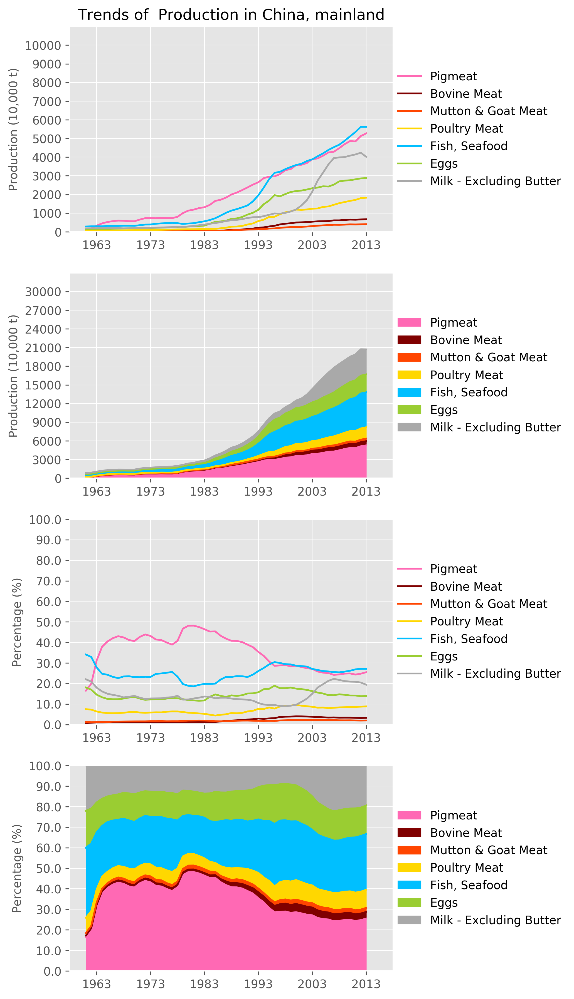

In [36]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# # 设置颜色
# cmeat,cfish,cegg,cmilk,coffal,cfat=\
# 'peru','deepskyblue','yellowgreen','darkgray','firebrick','orange'
# cpig,ccattle,cgoat,cbirds,cother=\
# 'hotpink','maroon','orangered','gold','lightslategray'

# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
#           )
# plotTrends(D, A, E, items_group='Meat', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cpig,ccattle,cgoat,cbirds,cother],
#           )

### 2. An Area's World Ranking of Some Items

In [22]:
def ranking_AreaItemInWorld(
    domain,
    area,
    element,
    items_group='',
    items=[],
    area_list=LIST_country,
    rank_max=200,
    fig_size=(5,5),
    colors=CLs,
):  
    
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)

    dfs = PVs_AreaYear[domain][area][element]
    
    # make a pivot for a particular area where 
    # years as indices, items as columns
    # items' rankings in areas list as values
    rankings = {}
    for i in items:
        if i in dfs.keys():
            df = dfs[i].copy()
            ranks = np.array([])
            try: 
                df_areas = df[df.index.isin(area_list)]
                for year in df_areas.columns:
                    rank = df_areas.sort_values(year, ascending=False).index.tolist().index(area)+1
                    ranks = np.append(ranks,rank)
                rankings[i]=ranks
            except:continue           
    df_rank = pd.DataFrame(rankings)
    df_rank.index = Years
    
    # plot settings
    X_step=10
    X_ticks=range(Years[-1]-50,Years[-1]+X_step,X_step)
    Y_label='Rankings'
    
    title = "World Ranking of {} in {}".format(element.title(), area)
    
    # === ploting ===
    # title
    fig = plt.figure(figsize = fig_size, dpi=300)
    plt.title(title, fontsize=TIT_size)
    
    # data
    df_ = df_rank.loc[X_ticks]      
    display(df_)
    df_.plot.line(color=colors, linestyle=':', marker='o', linewidth=3, alpha=1, ax=plt.gca())
    
    # legend
    ax = plt.gca()
    ax.legend(labels=rankings.keys(),fontsize=LEG_size,frameon=False,
             loc='center left',bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)
    
    # axes
    setX_quant(ax, X_ticks, X_step)
    setY_quant(ax, rank_max, Y_label)
    ax = plt.gca().invert_yaxis()
    
    # save
    path = './results/FAO_LivestockFish_CommodityBalance/img/Fig_1_' + title + '.png'
    bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
    fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
    print('Img saved as: ' + path)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
1963,3.0,43.0,12.0,3.0,4.0,3.0,31.0
1973,1.0,31.0,6.0,3.0,3.0,3.0,33.0
1983,1.0,24.0,3.0,4.0,3.0,3.0,26.0
1993,1.0,5.0,1.0,2.0,1.0,1.0,16.0
2003,1.0,3.0,1.0,2.0,1.0,1.0,8.0
2013,1.0,3.0,1.0,2.0,1.0,1.0,3.0


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_1_World Ranking of Production in China, mainland.png


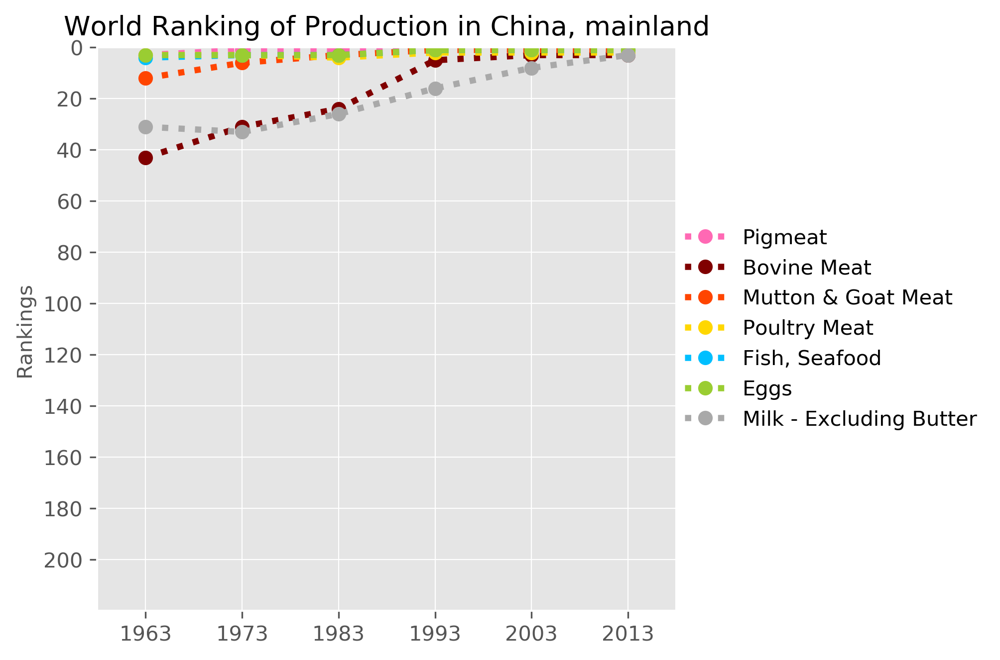

In [23]:
# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E)

### 3. Compare

In [ ]:
# OECD Map

In [198]:
# The average of a group
def sumOfGroup (
    domain,
    area,
    element,
    areas_list,
    items_group='',
    items=[],
):
     # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    df_res = pd.DataFrame()
    for i in items:
        df = PVs_YearArea[domain][area][element][i].copy()
        
        areas = []
        for c in df.columns:
            if c in areas_list: areas.append(c)
        df = df[areas]
        df = df.fillna(np.nan)

        df['Sum'] = df.apply(lambda x: x.sum(), axis=1)
            
        df = df['Sum']
        df_res = pd.concat([df_res, df],axis=1)
        
    df_res.columns = items
    df_res.index.names = ['Year']

    display (df_res.tail(5))
    return df_res

In [199]:
def trendsOfArea (
    domain,
    area,
    element,
    items_group='',
    items=[],
):
     # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    df_res = pd.DataFrame()
    for i in items:
        df = PVs_YearArea[domain][area][element][i].copy()

        df = df[[area]]
        df_res = pd.concat([df_res, df],axis=1)
        
    df_res.columns = items
    
    display (df_res.tail(5))
    return df_res

In [200]:
items=ITEMs.copy()
items.append('Meat')
avg_OECD = sumOfGroup (D, A, E, areas_list=LIST_group_OECD, items=items)
avg_asia = sumOfGroup (D, A, E, areas_list=LIST_group_asia, items=items)
china = trendsOfArea (D, A, E, items=items)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2009,3.7610e+07,2.6744e+07,2638752.0,3.8999e+07,2.9150e+07,1.8433e+07,3.0412e+08,1.0726e+08
2010,3.8066e+07,2.7417e+07,2489952.0,4.0180e+07,2.8620e+07,1.8470e+07,3.0860e+08,1.0949e+08
2011,3.8561e+07,2.7135e+07,2473881.0,4.1172e+07,2.9061e+07,1.8678e+07,3.1417e+08,1.1069e+08
2012,3.8510e+07,2.6815e+07,2486899.0,4.1911e+07,2.8336e+07,1.8630e+07,3.2170e+08,1.1109e+08
2013,3.8215e+07,2.6710e+07,2649159.0,4.2322e+07,2.7755e+07,1.9474e+07,3.2449e+08,1.1129e+08


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2009,1.0244e+07,9.1585e+06,3373871.0,1.6170e+07,4.5418e+07,1.3700e+07,2.1031e+08,3.9637e+07
2010,1.0442e+07,9.6919e+06,3333230.0,1.6816e+07,4.7560e+07,1.4131e+07,2.1849e+08,4.0960e+07
2011,1.0294e+07,9.9837e+06,3452295.0,1.7519e+07,4.7694e+07,1.4247e+07,2.2791e+08,4.1954e+07
2012,1.0521e+07,1.0291e+07,3526197.0,1.8139e+07,4.7749e+07,1.5110e+07,2.3683e+08,4.3359e+07
2013,1.0759e+07,1.0494e+07,3659689.0,1.8811e+07,4.7650e+07,1.5861e+07,2.4276e+08,4.4631e+07


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Meat
Year,,,,,,,,
2009,4.6934e+07,6354000.0,3838500.0,1.5949e+07,4.8765e+07,2.7425e+07,4.0046e+07,7.4589e+07
2010,4.8600e+07,6538400.0,3989000.0,1.6561e+07,5.1137e+07,2.7627e+07,4.0803e+07,7.7273e+07
2011,4.8407e+07,6475000.0,3931000.0,1.7088e+07,5.3445e+07,2.8114e+07,4.1435e+07,7.7552e+07
2012,5.1300e+07,6623000.0,4010000.0,1.8033e+07,5.6229e+07,2.8612e+07,4.2384e+07,8.1623e+07
2013,5.2733e+07,6730000.0,4081000.0,1.8265e+07,5.6229e+07,2.8760e+07,4.0193e+07,8.3462e+07


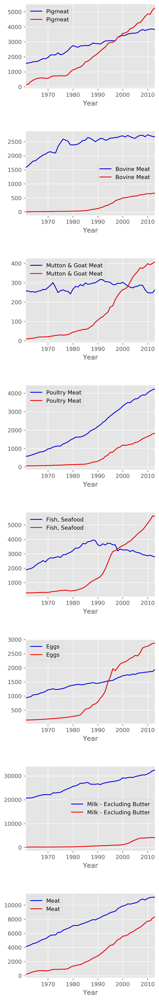

In [202]:
toUnit='10,000 t'
changeUnit=1/10000
df_avg_OECD = avg_OECD.copy() * changeUnit
df_avg_asia = avg_asia.copy() * changeUnit
df_china = china.copy() * changeUnit

df_avg_OECD.reset_index(inplace=True)
df_avg_asia.reset_index(inplace=True)
df_china.reset_index(inplace=True)

fig_rows = len(items)
fig_size = [15,4*fig_rows]

fig = plt.figure(figsize = fig_size,dpi=300)
fig.tight_layout()                          
plt.subplots_adjust(wspace =0.3, hspace =0.5)
# plt.suptitle(title, fontsize=TIT_size)

n=0
for i in items:
    ax = fig.add_subplot(fig_rows,3,3*n+1)
    df_avg_OECD.plot('Year', i, color='blue', ax=plt.gca())
    df_china.plot('Year', i, color='red', ax=plt.gca())
    
    n+=1

In [197]:
def compareToTopAreas(
    domain,
    area,
    element,
    items_group='',
    items=[],
    toUnit='',
    changeUnit=1,
): 
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
                
    # select pivots for a paticular item
    dfs = PVs_AreaYear[domain][area][element]
    
    # plot settings
    years = [Years[-1]-20,Years[-1]]  # set years for compare
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label = element + ' ({})'.format(toUnit)
    title = '{}: China, mainland Vs. Top 5 in the World'.format(element)

    # === Bar Plot ===
    fig_size=(15,15)
    fig=plt.figure(figsize=fig_size, dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.6, hspace =1.)
    
    plt.suptitle(title, fontsize=TIT_size)
    n=0
    for i in items:
        df = dfs[i][dfs[i].index.isin(LIST_country)].copy()
        df = df*changeUnit
        df = df.fillna(0)
        
        df_area = df[df.index==area][years]
        df_top = df.sort_values([years[-1]],ascending=False)[years].head()
        if area in df_top.index:pass
        else: df_top = pd.concat([df_top,df_area],sort=False)
#         print(Unit)
        display(df_top)
        
        n+=1
        ax = fig.add_subplot(4,3,n)
        df_top.plot.bar(ax=plt.gca())
        ax=plt.gca()
        plt.title('{}: \n{} Vs. World Top 5'.format(i, area), fontsize=TIT_size-1)
        plt.legend(loc='upper left',frameon=False,bbox_to_anchor=(1.,1.),borderaxespad = 0.)
        plt.xticks(rotation=30,ha='right',fontsize=TCK_size)
        plt.xlabel('')
        plt.yticks(fontsize=TCK_size)
        plt.ylabel(Y_label, fontsize=LAB_size)
        
    path = './results/FAO_LivestockFish_CommodityBalance/img/Fig_3_'+title+'.png'
    bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
    fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
    print('Img saved as: ' + path)

,1993,2013
Area,,
"China, mainland",2654.5900,5273.3000
United States of America,775.1000,1052.4520
Germany,364.5800,550.6772
Spain,208.8821,343.1214
Brazil,150.0000,328.0000


,1993,2013
Area,,
United States of America,1058.4000,1171.9380
Brazil,480.6900,967.5000
"China, mainland",218.9000,673.0000
Argentina,280.8000,282.2000
India,218.2566,257.6575


,1993,2013
Area,,
"China, mainland",137.3000,408.1000
India,63.6200,74.6600
Australia,65.4877,69.6937
New Zealand,48.8150,48.1859
Nigeria,18.1156,47.1910


,1993,2013
Area,,
United States of America,1243.9583,2008.5213
"China, mainland",573.6000,1826.4900
Brazil,323.5056,1291.5250
Russian Federation,127.7000,345.6639
Mexico,107.1041,284.6208


,1993,2013
Area,,
"China, mainland",1955.8941,5622.8526
Indonesia,365.7850,836.7872
Peru,900.9598,833.9115
India,447.9414,797.8587
United States of America,590.5730,565.9127


,1993,2013
Area,,
"China, mainland",1179.8000,2876.0000
United States of America,426.8000,577.7124
India,132.9000,383.5205
Japan,259.7684,252.1974
Mexico,123.3559,251.6094


,1993,2013
Area,,
India,5886.00,13560.0000
United States of America,6832.70,9127.6872
"China, mainland",785.74,4019.3200
Pakistan,1712.00,3901.7000
Brazil,1621.82,3265.3000


,1993,2013
Area,,
"China, mainland",3639.2230,8346.1640
United States of America,3117.9833,4268.9271
Brazil,968.5447,2601.0550
Russian Federation,751.3000,854.4195
Germany,592.6480,823.8428


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_3_Production: China, mainland Vs. Top 5 in the World.png


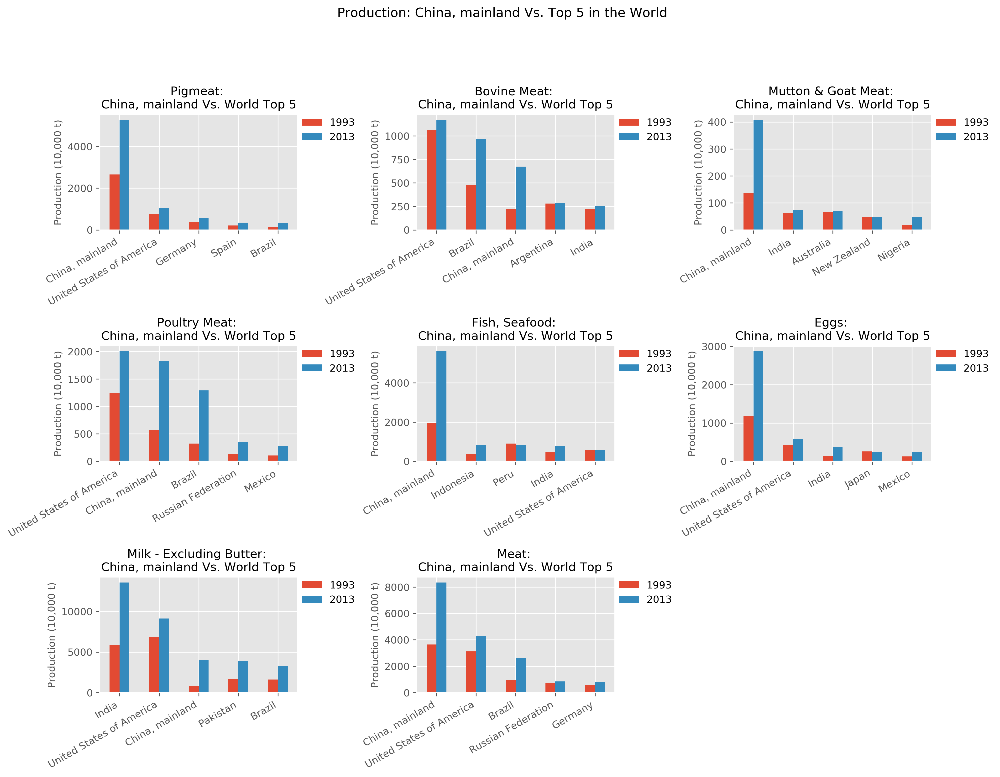

In [25]:
items=ITEMs.copy()
items.append('Meat')
compareToTopAreas(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

In [29]:
# def mkAtlasOfWorld(
# prameters ...
# ):        
#         threshold_scale = np.linspace(df.values.min().min(),df.values.max(), 6, dtype=int).tolist()
#         threshold_scale[-1] = threshold_scale[-1] + 1
        
#         for y in years:
#             legend = "{}, {}, {}".format(Y_label, i, y)
            
#             world_map = folium.Map(
#                 width=1000,height=600,
#                 location=[10, 0], 
#                 zoom_start=2, 
#                 tiles='Mapbox Bright',
#             )

#             folium.Choropleth(
#                 geo_data= r'world_countries.json',
#                 data=df[y],
#                 columns=[df.index, 'Value'],
#                 key_on='feature.properties.name',   # must be 'feature', not 'features'
#                 threshold_scale=threshold_scale,
#                 fill_color='OrRd', 
#                 fill_opacity=0.9, 
#                 line_opacity=0.2,
#                 highlight=True,
#                 legend_name=legend,
#                 reset=False
#             ).add_to(world_map)
            
#             print(legend)
#             display(world_map)

### 4. Main Contribution of an Area

In [30]:
# 设置主要贡献方面
ITEMs_main = ['Pigmeat', 'Fish, Seafood', 'Eggs']

In [31]:
def mkPVs_compareAreaToGroup(
    domain,
    area,
    element,
    items,
    areas_group='World',
):
    
    items = items
    
    # transposed from PVs (Area-Year) to new pivots (Year-Area) for a particular item
    pivots={}
    n=0
    for i in items:
        n+=1
        pivots[i]=PVs[domain][area][element][i].copy()
        pivots[i]=pivots[i][pivots[i].index.isin([area, areas_group])].transpose()
        pivots[i].index.names = ['Year']
#         print(i)
#         display(pivots[i].tail(2))
    
    # make a pivot for a particular area where 'Area' as index, items as columns
    pivot_A=pd.DataFrame()
    for i in items:
        pivot_A = pd.concat([pivot_A, pivots[i][area]], axis=1)
    pivot_A.columns=items
#     print(area)
#     display(pivot_A.tail(2))
    
    # make a pivot for the group where the area is in, where 'Area' as index, items as columns
    pivot_G=pd.DataFrame()
    for i in items:
        pivot_G = pd.concat([pivot_G, pivots[i][areas_group]], axis=1)
    pivot_G.columns=items
#     print(areas_group)
#     display(pivot_G.tail(2))
    
    # a dictionary contains 3 pivots above
    pivots_AG={
        (area,areas_group):pivots,
        area:pivot_A,
        areas_group:pivot_G,
    }
    return pivots_AG

In [32]:
def proportion_AreaToGroup(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
    toUnit='',
    changeUnit=1,
    kind='area',
):  
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    # make a dictionary of 'mkPVs_compareAreaToGroup()'
    PVs_AG[domain]={}
    PVs_AG[domain][area]={}
    PVs_AG[domain][area][element]=mkPVs_compareAreaToGroup(domain, area, element,items=items)

    # plot settings
    fig_row=(len(items)+1)//2
    fig_size=(10,fig_row*3)
    
    title = "{}: {} VS {}".format(element, area, group)
    
    if kind=='area':alpha=0.4
    else:alpha=1
        
    X_step=10
    X_ticks=range(Years[-1]-50,Years[-1]+X_step,X_step)
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label=element+' ({})'.format(toUnit)

    # ===
    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.3, hspace =0.3)
    plt.suptitle(title, fontsize=TIT_size)
    
    n=0
    for i in items:
        n+=1
        ax = fig.add_subplot(fig_row,2,n)
        plt.title(i, fontsize=TIT_size)
        df = PVs_AG[domain][area][element][(area,group)][i].copy()
        df=df*changeUnit
        df.plot(kind=kind,stacked=False, alpha=alpha, ax=plt.gca())

        ax=plt.gca()
        ax.legend(fontsize=LEG_size, loc='upper left')

        X_step=5
        setX_quant(ax, X_ticks, X_step)

        Y_max=df.values.max()
        setY_quant(ax, 1.5*Y_max, Y_label)
    
    path = './results/FAO_LivestockFish_CommodityBalance/img/Fig_4_'+title+'.png'
    bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
    fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
    print('Img saved as: ' + path)

Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_4_Production: China, mainland VS World.png


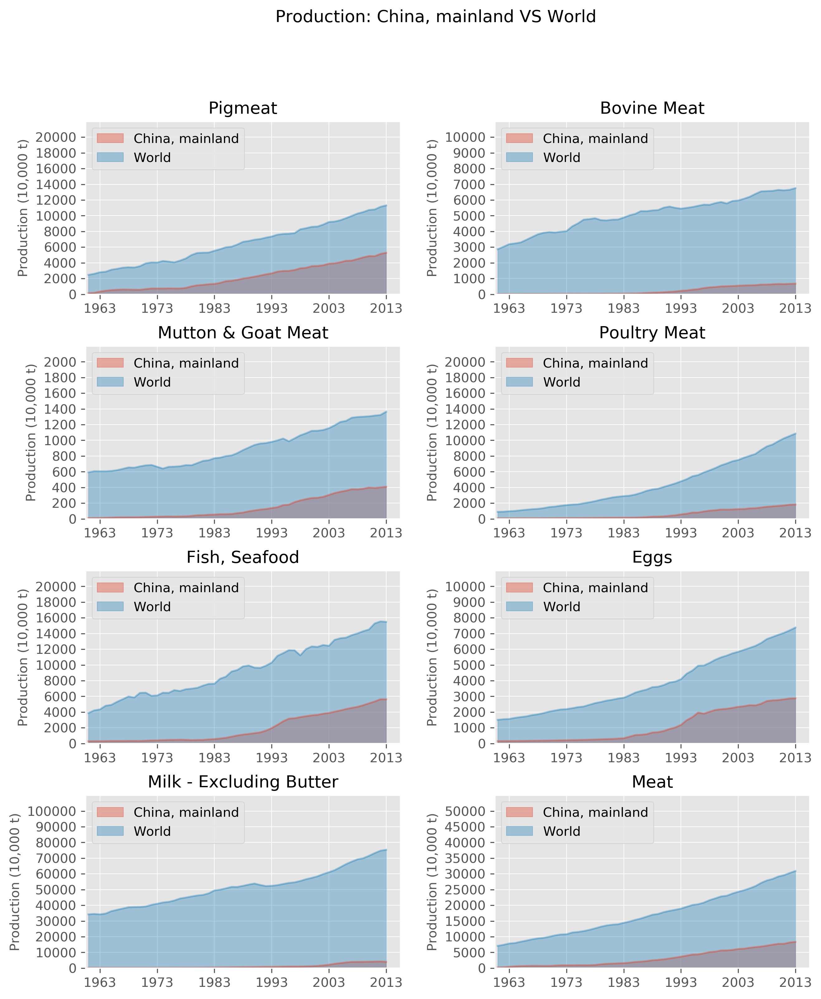

In [33]:
items = ITEMs.copy()
items.append('Meat')
proportion_AreaToGroup(D,A,E, items=items, toUnit='10,000 t', changeUnit=1/10000, kind='area')

In [34]:
def pi_compareAreaToGroup(
    domain,
    area,
    element,
    items_group='',
    items=[],
    years=[Years[0],Years[-1]],
    group='World',
    other='Other Areas',
    colors=CLs,
    fig_size=(13,6),
):
    
    # set items
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
                
    # plot settings
    title = "Proportions of Different {} in {} and the Proportions {} takes".format(element, group, area)
        
    # plot all items in the world...
    
    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.3, hspace =0.2)
    plt.suptitle(title, fontsize=TIT_size)

    fig_no=0
    for y in years:
        fig_no+=1

        df=pd.concat([PVs_AG[domain][area][element][area].loc[y],
                      PVs_AG[domain][area][element][group].loc[y]],axis=1).copy()

        df=df[df.index.isin(items)]
        df.columns=[area,group]
        df[other] = df[group] - df[area]

        print(y)
        display(df)

        ax = fig.add_subplot(1,2, fig_no)
        plt.title(y, fontsize=TIT_size)

        size = 0.5
        outer_radius = 2
        inner_colors = ['r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray']

        outer_explode = np.zeros(len(items))
        inner_explode = np.zeros(len(items*2))

        for n in range(len(items)):
            if items[n] in ITEMs_main:
                outer_explode[n] = 0.15
                inner_explode[2*n] = 0.15

        area_pct = ['{}{}'.format(int(df.loc[i][area]/df.loc[i][group]*100),'%') for i in df.index.values]
        inner_labels = []
        for i in area_pct:
            inner_labels.append(i)
            inner_labels.append('')

        shadow = False
        startangle = 0
        plt.pie(df[group].values, 
                autopct='%1.0f%%',
                pctdistance=1.06,
                explode=list(outer_explode),
                radius=outer_radius, 
                colors=colors,
                center = (0,0),
                textprops = {'fontsize':LEG_size}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
                )
        plt.pie(df[[area,other]].values.flatten(), 
                labels=inner_labels,
                labeldistance = 0.8,
                explode=list(inner_explode),
                radius=outer_radius-size, 
                colors=inner_colors,
                center = (0,0),
                textprops = {'fontsize':LEG_size}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
               )
        plt.axis('equal')          # equal 使得为正圆

    ax=plt.gca()
    ax.legend(labels=list(df.index.values)+[area,other],frameon=False,fontsize=LEG_size, 
              loc='lower center',bbox_to_anchor=(-0.1,-0.1),borderaxespad = 0.)
    
    path = './results/FAO_LivestockFish_CommodityBalance/img/Fig_5_'+title+'.png'
    bbox = matplotlib.transforms.Bbox([[-1, -1], list(map(lambda x:x+2, list(fig_size)))])
    fig.savefig(path, format='png', transparent=False, dpi=300, bbox_inches =bbox)
    print('Img saved as: ' + path)

1961


,"China, mainland",World,Other Areas
Pigmeat,1370000.0,2.4666e+07,2.3296e+07
Bovine Meat,59500.0,2.8661e+07,2.8601e+07
Mutton & Goat Meat,100000.0,5.9319e+06,5.8319e+06
Poultry Meat,622000.0,8.8933e+06,8.2713e+06
"Fish, Seafood",2835600.0,3.8762e+07,3.5926e+07
Eggs,1500000.0,1.5068e+07,1.3568e+07
Milk - Excluding Butter,1833000.0,3.4227e+08,3.4043e+08


2013


,"China, mainland",World,Other Areas
Pigmeat,5.2733e+07,1.1307e+08,6.0335e+07
Bovine Meat,6.7300e+06,6.7540e+07,6.0810e+07
Mutton & Goat Meat,4.0810e+06,1.3640e+07,9.5590e+06
Poultry Meat,1.8265e+07,1.0852e+08,9.0252e+07
"Fish, Seafood",5.6229e+07,1.5485e+08,9.8620e+07
Eggs,2.8760e+07,7.3785e+07,4.5025e+07
Milk - Excluding Butter,4.0193e+07,7.5304e+08,7.1284e+08


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_5_Proportions of Different Production in World and the Proportions China, mainland takes.png


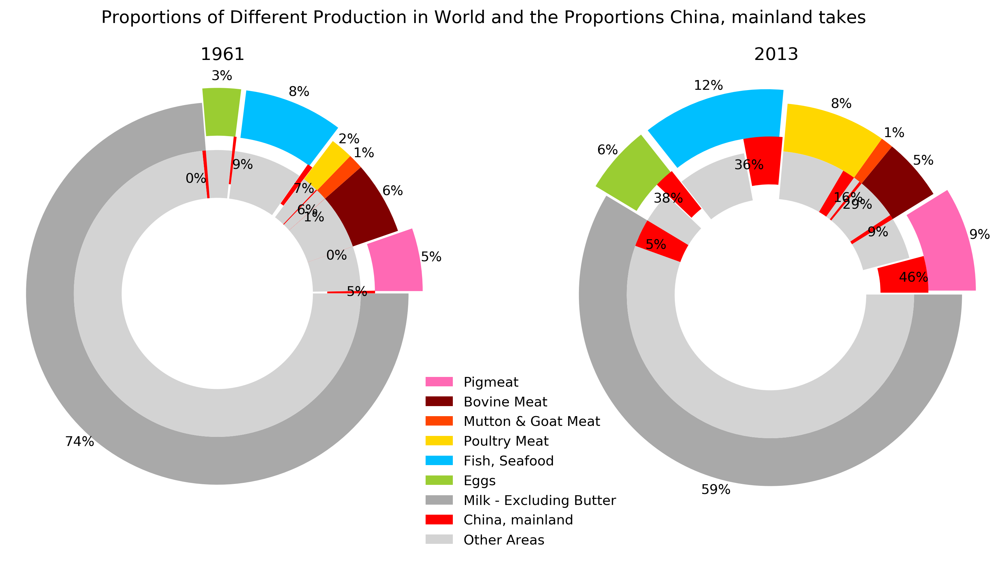

In [35]:
pi_compareAreaToGroup(D,A,E)

# Part 2. 'Import Quantity'

['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']
['Poultry Meat', 'Meat', 'Mutton & Goat Meat', 'Meat, Other', 'Offals', 'Eggs', 'Milk - Excluding Butter', 'Animal fats', 'Bovine Meat', 'Fish, Seafood', 'Pigmeat']
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
1963,16.0,150.0,105.0,115.0,146.0,113.0,90.0
1973,128.0,141.0,106.0,122.0,149.0,121.0,149.0
1983,130.0,139.0,106.0,64.0,22.0,130.0,65.0
1993,89.0,83.0,71.0,9.0,3.0,47.0,49.0
2003,11.0,42.0,7.0,4.0,1.0,113.0,18.0
2013,6.0,8.0,1.0,7.0,1.0,133.0,2.0


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_1_World Ranking of Import Quantity in China, mainland.png


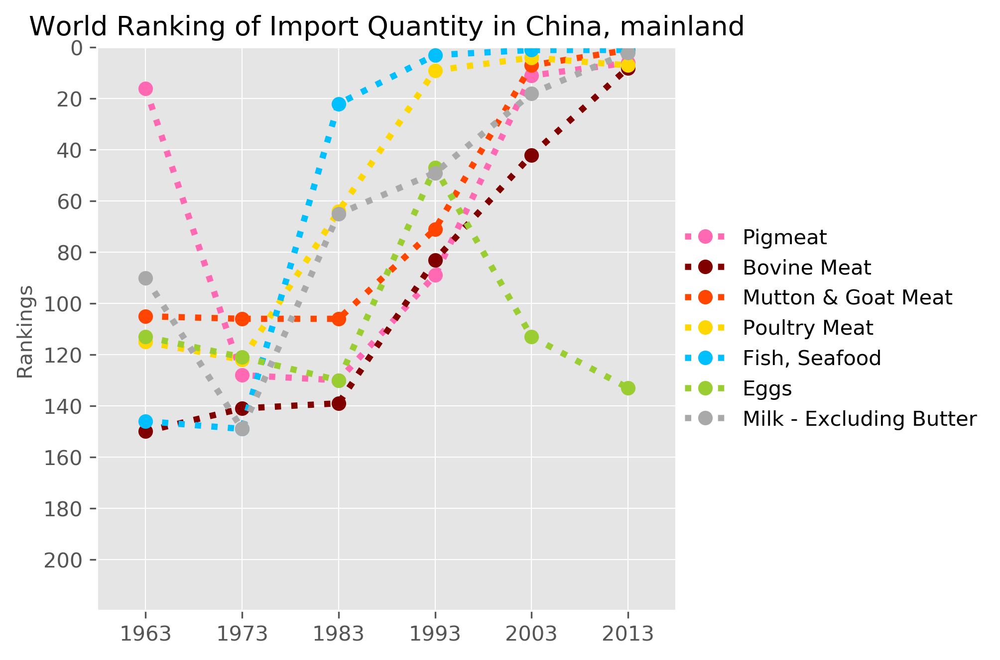

In [36]:
E = 'Import Quantity'
toUnit = '10,000 t'
changeUnit = 1/10000

# 生成条件
CDTs[D][A][E] = Is
# print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)
# for i, pv in PVs_AreaYear[D][A][E].items():
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,20.5316,2.0894,6.6466,74.9720,934.2316,0.0168,229.5658
2010,29.4371,3.2973,5.6968,54.2464,845.0838,0.0368,368.8691
2011,63.3089,2.7893,8.3144,42.1170,967.5309,0.0406,413.2399
2012,71.4522,8.5063,12.3939,52.1850,932.9840,0.0218,567.7579
2013,81.4674,39.4137,25.8723,58.4195,932.9840,0.0179,820.6767


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_2_a_Trends of  Import Quantity in China, mainland.png


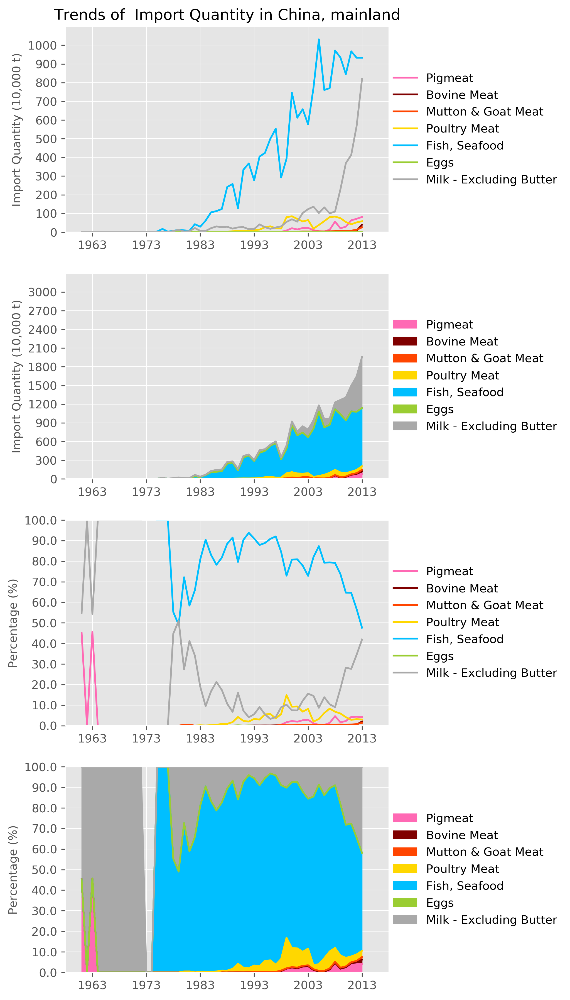

In [37]:
# # 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 可以观察pivot决定是否增设 items group, 并设置颜色

# 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
#           )
# plotTrends(D, A, E, items_group='Meat', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cpig,ccattle,cgoat,cbirds,cother],
#           )

,1993,2013
Area,,
Japan,50.3044,136.3412
Germany,98.8305,118.6776
Italy,64.8226,107.8858
United Kingdom,51.0695,104.7276
Russian Federation,41.5039,91.8641
"China, mainland",0.0344,81.4674


,1993,2013
Area,,
United States of America,115.5684,111.2529
Russian Federation,65.8742,80.6603
Japan,68.8828,68.3770
Italy,43.1650,46.6859
United Kingdom,31.1371,44.5852
"China, mainland",0.3054,39.4137


,1993,2013
Area,,
"China, mainland",0.0106,25.8723
France,16.1346,10.3465
United Kingdom,10.6560,9.8917
United States of America,2.4331,8.5367
Saudi Arabia,3.2922,5.1272


,1993,2013
Area,,
"China, Hong Kong SAR",36.2628,118.5857
Japan,43.5734,105.6260
Saudi Arabia,16.9974,87.9391
Mexico,19.2056,84.8565
United Kingdom,18.8340,81.1889
"China, mainland",9.9747,58.4195


,1993,2013
Area,,
"China, mainland",277.2741,932.9840
United States of America,347.3976,503.2992
Japan,462.1199,434.3308
Nigeria,43.7720,275.5023
Germany,227.7388,262.7458


,1993,2013
Area,,
Germany,22.3141,46.3892
Iraq,0.3000,29.4308
Netherlands,5.0317,24.3800
United Kingdom,2.2393,12.2346
"China, Hong Kong SAR",8.2729,11.4223
"China, mainland",0.1243,0.0179


,1993,2013
Area,,
Germany,536.3072,833.1570
"China, mainland",16.9337,820.6767
Italy,643.8559,769.5071
United Kingdom,221.1882,595.2571
United States of America,426.9944,523.4749


,1993,2013
Area,,
Japan,171.7635,312.8840
United Kingdom,112.2313,250.2419
Germany,188.8321,249.8035
Russian Federation,126.7355,228.6117
"China, mainland",10.4828,205.3809


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_3_Import Quantity: China, mainland Vs. Top 5 in the World.png


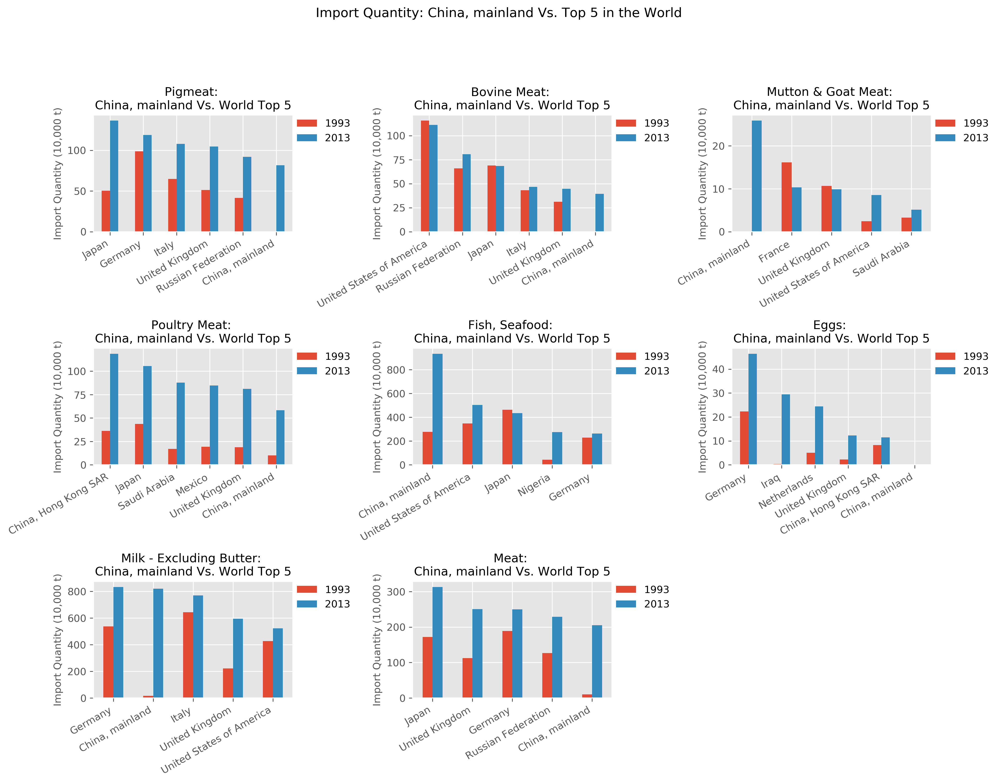

In [38]:
items=ITEMs.copy()
items.append('Meat')
compareToTopAreas(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_4_Import Quantity: China, mainland VS World.png
1983


,"China, mainland",World,Other Areas
Pigmeat,0.0,2.9327e+06,2.9327e+06
Bovine Meat,0.0,4.5017e+06,4.5017e+06
Mutton & Goat Meat,0.0,7.9250e+05,7.9250e+05
Poultry Meat,640.0,1.5745e+06,1.5738e+06
"Fish, Seafood",291840.0,2.1934e+07,2.1642e+07
Eggs,0.0,9.2341e+05,9.2341e+05
Milk - Excluding Butter,68451.0,5.0611e+07,5.0542e+07


2013


,"China, mainland",World,Other Areas
Pigmeat,814674.0,1.4894e+07,1.4080e+07
Bovine Meat,394137.0,1.0045e+07,9.6505e+06
Mutton & Goat Meat,258723.0,1.0710e+06,8.1231e+05
Poultry Meat,584195.0,1.5113e+07,1.4528e+07
"Fish, Seafood",9329840.0,6.0313e+07,5.0983e+07
Eggs,179.0,2.5540e+06,2.5538e+06
Milk - Excluding Butter,8206767.0,1.1681e+08,1.0860e+08


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_5_Proportions of Different Import Quantity in World and the Proportions China, mainland takes.png


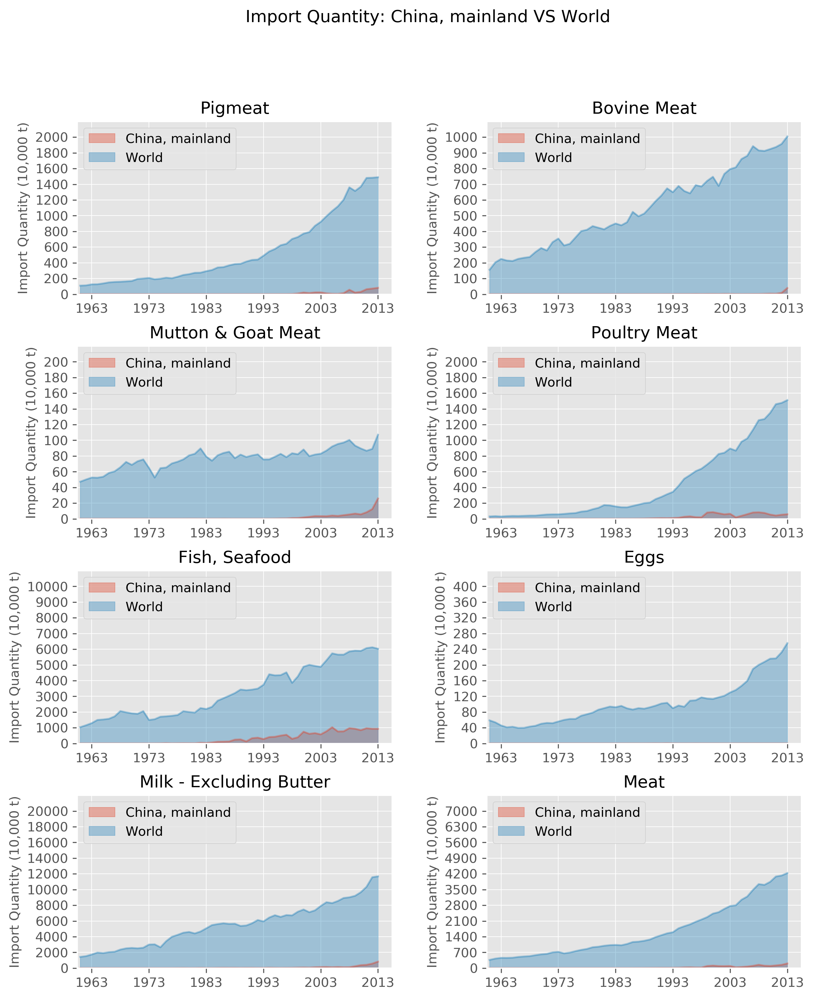

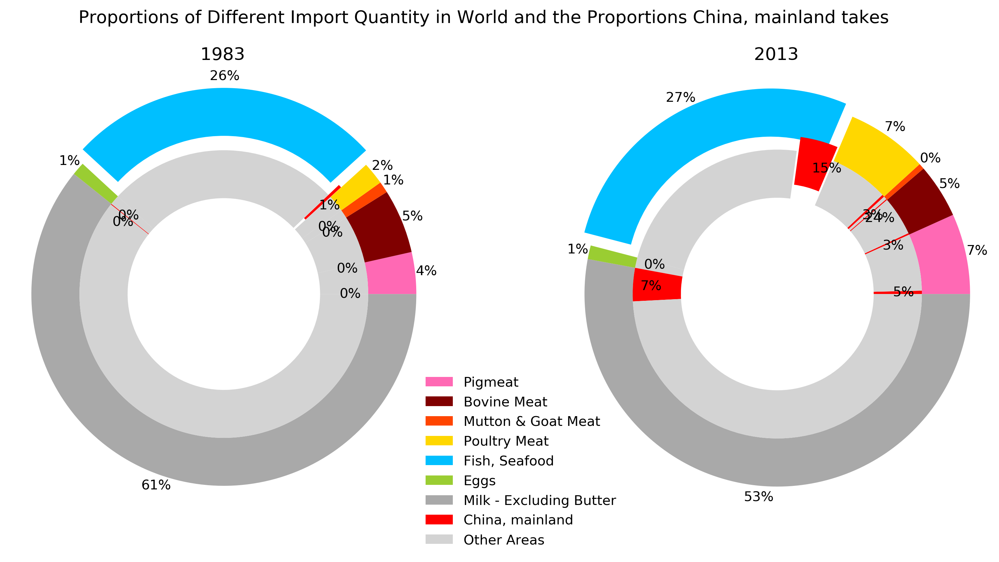

In [39]:
ITEMs_main=['Fish, Seafood']

items=ITEMs.copy()
items.append('Meat')
proportion_AreaToGroup(D,A,E,items=items, toUnit='10,000 t',changeUnit=1/10000, kind='area')

pi_compareAreaToGroup(D,A,E,years=[Years[-1]-30,Years[-1]])

# Part 3. 'Export Quantity'

{'CommodityBalances_LivestockFish': {'China, mainland': {'Production': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Import Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Export Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'M

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
1963,8.0,108.0,69.0,10.0,118.0,3.0,118.0
1973,4.0,38.0,21.0,6.0,23.0,3.0,35.0
1983,5.0,21.0,18.0,8.0,29.0,4.0,39.0
1993,9.0,11.0,23.0,8.0,12.0,7.0,39.0
2003,10.0,20.0,8.0,7.0,2.0,4.0,29.0
2013,12.0,29.0,19.0,8.0,1.0,9.0,55.0


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_1_World Ranking of Export Quantity in China, mainland.png


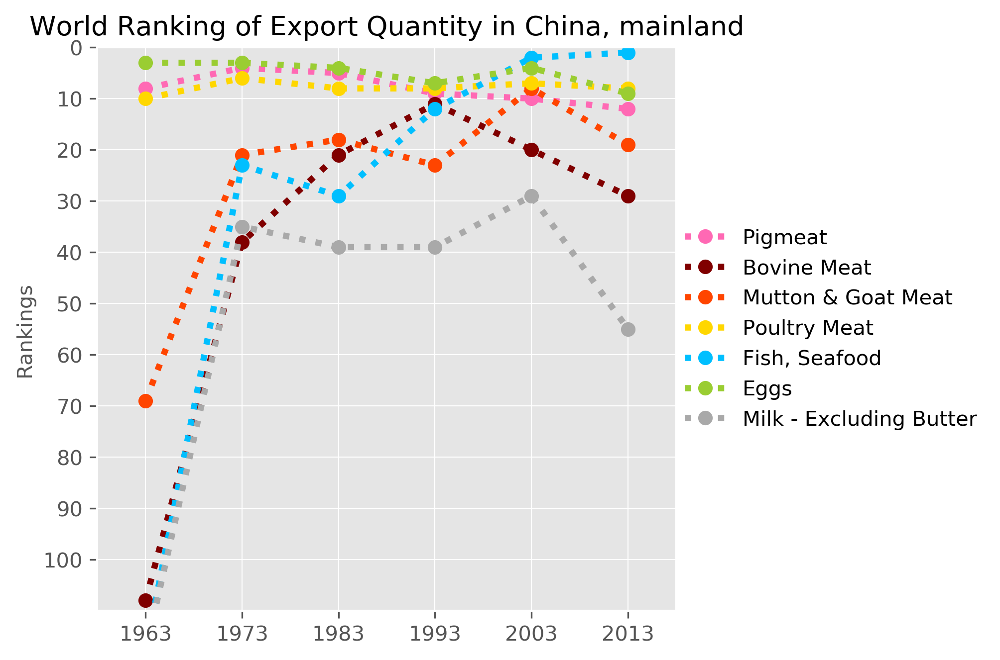

In [40]:
E = 'Export Quantity'
toUnit = '10,000'
changeUnit = 1/10000

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)
# for i, pv in PVs_AreaYear[D][A][E].items():
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E,rank_max=150)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,26.3532,8.5996,0.9532,38.5840,625.9197,14.5795,14.9303
2010,31.7968,5.5291,1.3481,49.1647,738.0369,11.0158,19.0085
2011,27.6404,6.0087,0.8118,55.2148,829.0502,10.8222,23.7493
2012,26.2105,10.1888,0.5044,55.3811,717.0465,10.8398,25.9764
2013,27.9497,3.4658,0.3215,56.3993,717.0465,9.7837,12.8885


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_2_a_Trends of  Export Quantity in China, mainland.png


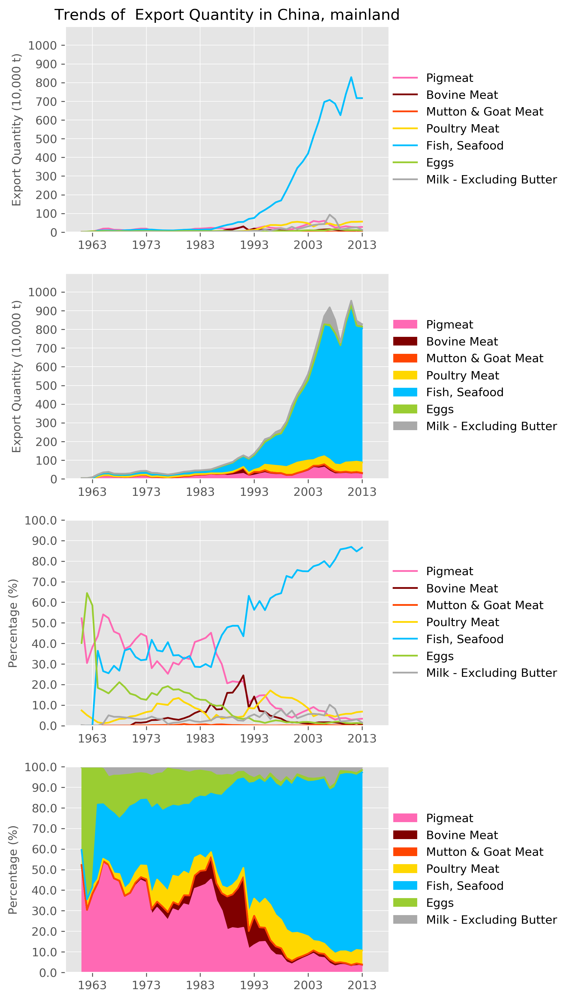

In [41]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 可以观察pivot决定是否增设 items group, 并设置颜色

# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
#           )
# plotTrends(D, A, E, items_group='Meat', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cpig,ccattle,cgoat,cbirds,cother],
#           )

,1993,2013
Area,,
Germany,23.2918,240.7126
United States of America,18.8017,228.9406
Denmark,110.1488,144.6941
Spain,7.3050,128.7725
Canada,29.6748,126.2754
"China, mainland",17.8237,27.9497


,1993,2013
Area,,
Brazil,44.3348,186.8135
India,10.1802,155.9423
Australia,108.5231,153.7728
United States of America,61.9563,124.5021
New Zealand,44.2963,54.0657
"China, mainland",19.1438,3.4658


,1993,2013
Area,,
Australia,22.1186,44.9705
New Zealand,35.9144,39.8551
United Kingdom,10.7924,10.3464
Ireland,6.4049,4.2595
Spain,0.5365,3.4440
"China, mainland",0.1917,0.3215


,1993,2013
Area,,
United States of America,107.3785,408.6159
Brazil,52.5907,390.2419
Netherlands,40.3396,113.8189
"China, Hong Kong SAR",16.9738,80.5527
Germany,8.6542,67.6184
"China, mainland",11.2769,56.3993


,1993,2013
Area,,
"China, mainland",76.0347,717.0465
Peru,764.7868,622.3122
Norway,189.6710,289.5180
Thailand,128.4468,266.5796
United States of America,150.6994,263.1018


,1993,2013
Area,,
Netherlands,41.8254,65.4677
Turkey,0.0667,28.1400
United States of America,10.6460,26.8653
Poland,0.0180,24.7605
Germany,5.0194,15.2164
"China, mainland",3.1006,9.7837


,1993,2013
Area,,
New Zealand,605.9518,1894.4464
Germany,1195.5285,1567.7259
United States of America,184.8038,1075.6405
Netherlands,826.2105,1071.4369
France,716.1488,1008.4225
"China, mainland",7.4081,12.8885


,1993,2013
Area,,
United States of America,193.3485,763.0142
Brazil,103.3692,652.9352
Germany,88.6834,352.0075
Netherlands,173.8960,284.5708
Australia,133.3755,207.8132
"China, mainland",53.0610,90.0748


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_3_Export Quantity: China, mainland Vs. Top 5 in the World.png


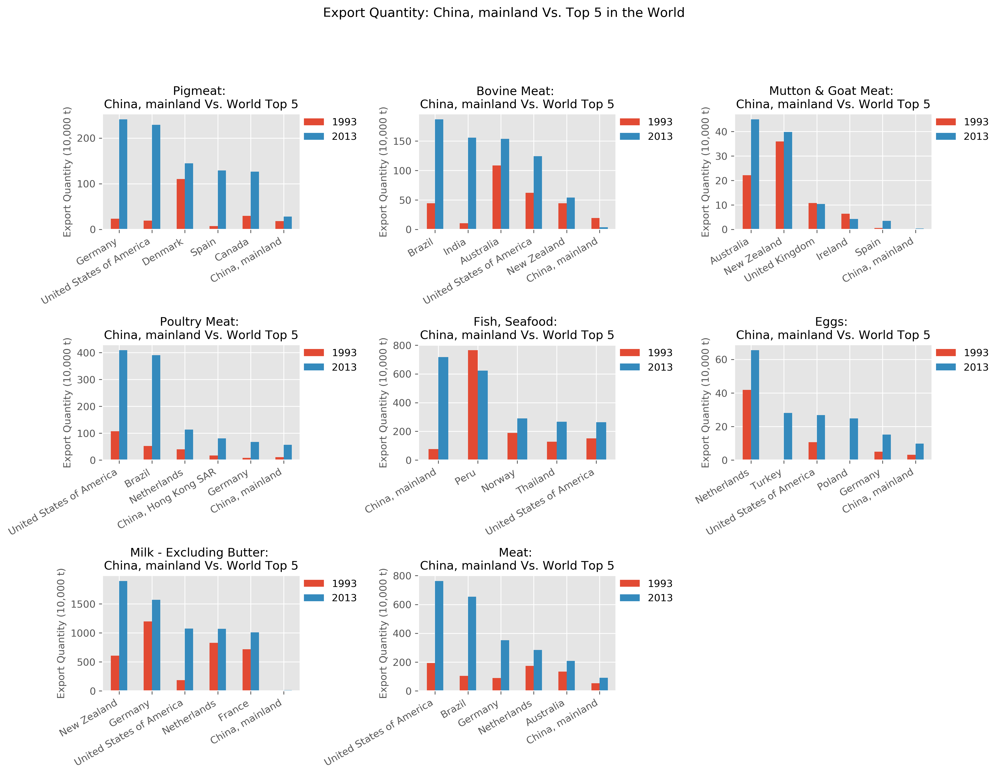

In [42]:
items=ITEMs.copy()
items.append('Meat')
compareToTopAreas(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_4_Export Quantity: China, mainland VS World.png
1983


,"China, mainland",World,Other Areas
Pigmeat,190488.0,3.1011e+06,2.9106e+06
Bovine Meat,32857.0,4.8996e+06,4.8667e+06
Mutton & Goat Meat,2600.0,9.1157e+05,9.0897e+05
Poultry Meat,35246.0,1.7644e+06,1.7292e+06
"Fish, Seafood",130467.0,2.1351e+07,2.1221e+07
Eggs,57777.0,9.1535e+05,8.5757e+05
Milk - Excluding Butter,8333.0,5.1028e+07,5.1019e+07


2013


,"China, mainland",World,Other Areas
Pigmeat,279497.0,1.5451e+07,1.5172e+07
Bovine Meat,34658.0,1.1897e+07,1.1863e+07
Mutton & Goat Meat,3215.0,1.2091e+06,1.2059e+06
Poultry Meat,563993.0,1.6691e+07,1.6127e+07
"Fish, Seafood",7170465.0,5.4928e+07,4.7758e+07
Eggs,97837.0,2.7836e+06,2.6858e+06
Milk - Excluding Butter,128885.0,1.2510e+08,1.2497e+08


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_5_Proportions of Different Export Quantity in World and the Proportions China, mainland takes.png


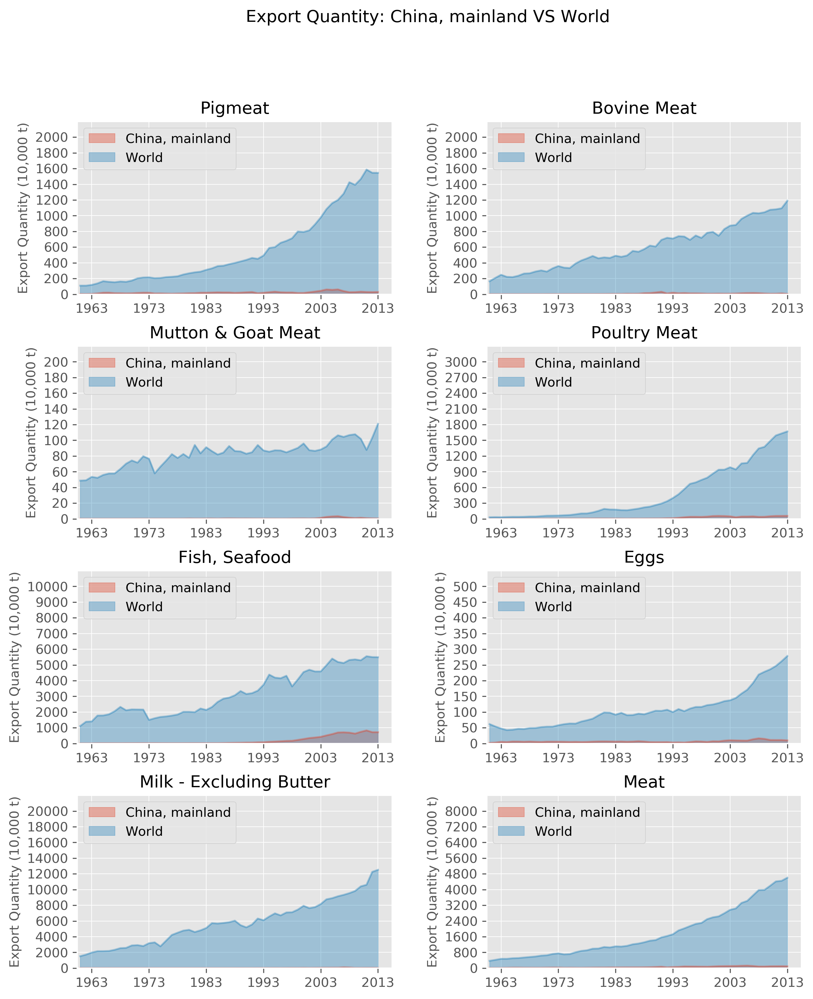

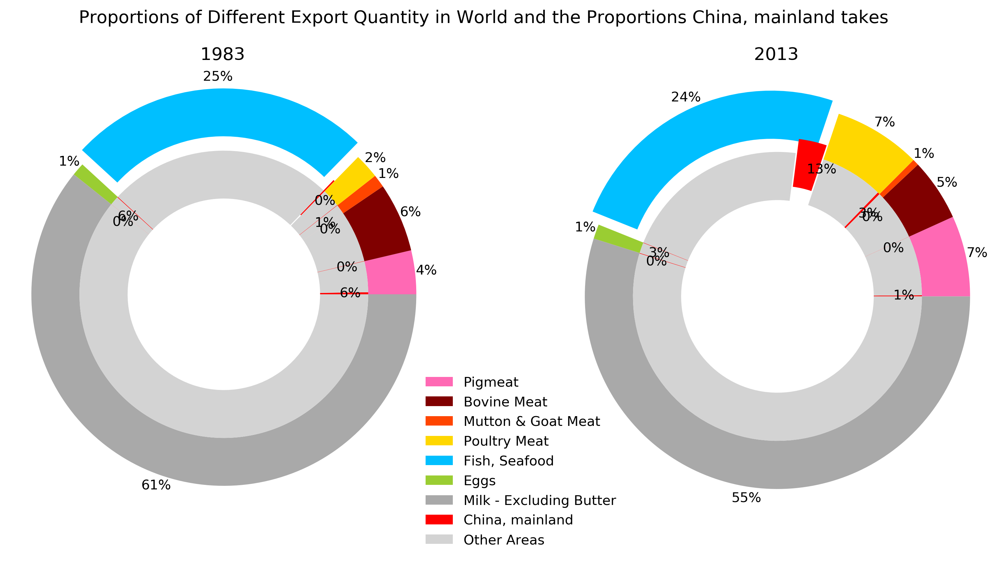

In [43]:
ITEMs_main=['Fish, Seafood']

items=ITEMs.copy()
items.append('Meat')
proportion_AreaToGroup(D,A,E,items=items, toUnit='10,000 t',changeUnit=1/10000, kind='area')

pi_compareAreaToGroup(D,A,E,years=[Years[-1]-30,Years[-1]])

# Part 4. 'Domestic supply quantity' 

['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']
['Poultry Meat', 'Meat', 'Mutton & Goat Meat', 'Meat, Other', 'Offals', 'Eggs', 'Milk - Excluding Butter', 'Animal fats', 'Bovine Meat', 'Fish, Seafood', 'Pigmeat']
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
1963,3.0,41.0,11.0,3.0,4.0,3.0,33.0
1973,1.0,27.0,6.0,3.0,4.0,3.0,32.0
1983,1.0,25.0,2.0,3.0,3.0,3.0,24.0
1993,1.0,6.0,1.0,2.0,1.0,1.0,17.0
2003,1.0,3.0,1.0,2.0,1.0,1.0,7.0
2013,1.0,3.0,1.0,1.0,1.0,1.0,3.0


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_1_World Ranking of Domestic Supply Quantity in China, mainland.png


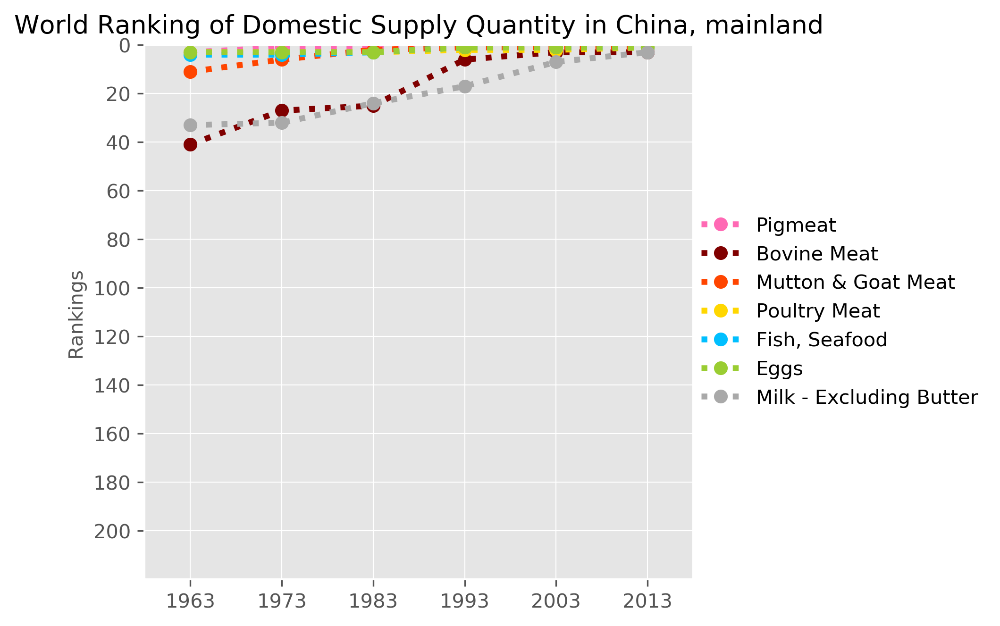

In [44]:
E = 'Domestic supply quantity'
toUnit = '10,000'
changeUnit = 1/10000

# 生成条件
CDTs[D][A][E] = Is
# display(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

# for i, pv in PVs_AreaYear[D][A][E].items():
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E)

,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,4687.6184,628.8898,389.5434,1631.2880,5173.6646,2727.9373,4219.2491
2010,4857.6403,651.6082,403.2487,1661.1817,5215.1522,2751.7210,4430.1425
2011,4876.3684,644.2805,400.6026,1695.7022,5499.6285,2800.6284,4532.9906
2012,5175.2417,660.6176,412.8895,1800.0599,5838.7902,2850.3820,4780.1915
2013,5326.8177,708.9479,433.6508,1828.5101,5838.7902,2866.2342,4827.1082


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_2_a_Trends of  Domestic supply quantity in China, mainland.png


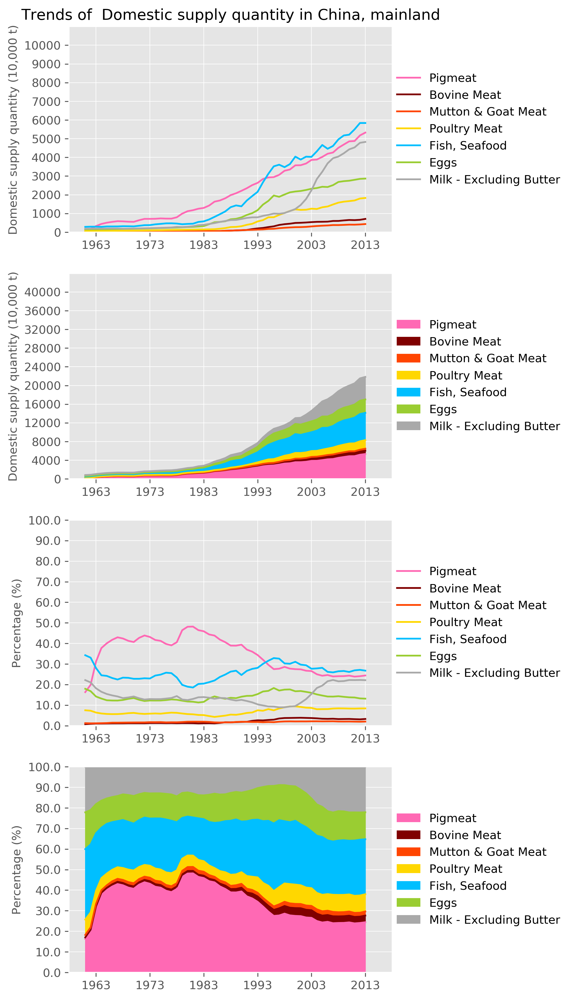

In [45]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 可以观察pivot决定是否增设 items group, 并设置颜色

# # 重要总类的分类
# plotTrends(D, A, E, items_group=['Animal Products'], 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
#           )
# plotTrends(D, A, E, items_group=['Meat'], 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cpig,ccattle,cgoat,cbirds,cother],
#           )

,1993,2013
Area,,
"China, mainland",2636.8007,5326.8177
United States of America,791.5157,872.8419
Germany,440.1187,428.6422
Russian Federation,284.6963,367.0741
Viet Nam,85.8300,320.8609


,1993,2013
Area,,
United States of America,1104.4121,1158.6889
Brazil,439.4111,786.3343
"China, mainland",200.0616,708.9479
Argentina,250.6152,258.9084
Russian Federation,401.6853,243.0371


,1993,2013
Area,,
"China, mainland",137.1189,433.6508
India,62.5178,72.5228
Nigeria,18.1156,47.1941
Pakistan,59.4847,44.8375
Sudan,0.0000,37.6210


,1993,2013
Area,,
"China, mainland",572.2977,1828.5101
United States of America,1138.5649,1610.0103
Brazil,270.9161,901.6208
Russian Federation,145.5391,395.6626
Mexico,126.0750,368.5020


,1993,2013
Area,,
"China, mainland",2157.1335,5838.7902
United States of America,785.2712,806.1101
Japan,1213.1815,789.0414
Indonesia,363.2536,787.1345
India,422.4490,699.1531


,1993,2013
Area,,
"China, mainland",1176.8236,2866.2342
United States of America,416.8074,551.9032
India,132.1878,376.2508
Mexico,124.6269,261.5733
Japan,262.9988,256.0072


,1993,2013
Area,,
India,5887.3762,13344.2969
United States of America,7070.1368,8796.4931
"China, mainland",795.2656,4827.1082
Pakistan,1718.0075,3912.6320
Russian Federation,4686.7415,3518.2300


,1993,2013
Area,,
"China, mainland",3596.6449,8461.4701
United States of America,3072.4693,3686.0001
Brazil,868.7240,1955.1797
Russian Federation,877.8244,1072.5952
Mexico,375.7201,761.2905


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_3_Domestic supply quantity: China, mainland Vs. Top 5 in the World.png


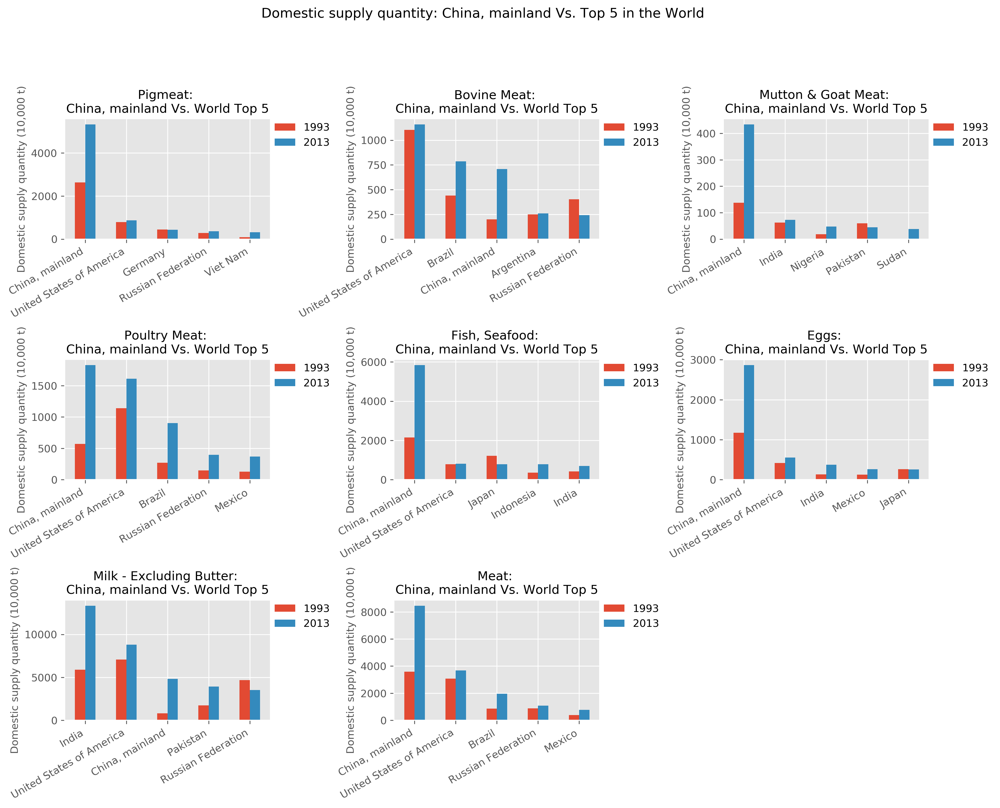

In [46]:
items=ITEMs.copy()
items.append('Meat')
compareToTopAreas(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_4_Domestic supply quantity: China, mainland VS World.png
1983


,"China, mainland",World,Other Areas
Pigmeat,1.2971e+07,5.5167e+07,4.2196e+07
Bovine Meat,3.2414e+05,4.8262e+07,4.7938e+07
Mutton & Goat Meat,5.4240e+05,7.6099e+06,7.0675e+06
Poultry Meat,1.4504e+06,2.8835e+07,2.7385e+07
"Fish, Seafood",5.7780e+06,7.6969e+07,7.1191e+07
Eggs,3.2652e+06,2.9151e+07,2.5886e+07
Milk - Excluding Butter,3.9261e+06,4.8921e+08,4.8529e+08


2013


,"China, mainland",World,Other Areas
Pigmeat,5.3268e+07,1.1255e+08,5.9284e+07
Bovine Meat,7.0895e+06,6.5717e+07,5.8627e+07
Mutton & Goat Meat,4.3365e+06,1.3502e+07,9.1655e+06
Poultry Meat,1.8285e+07,1.0698e+08,8.8691e+07
"Fish, Seafood",5.8388e+07,1.5953e+08,1.0114e+08
Eggs,2.8662e+07,7.3572e+07,4.4909e+07
Milk - Excluding Butter,4.8271e+07,7.4887e+08,7.0060e+08


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_5_Proportions of Different Domestic supply quantity in World and the Proportions China, mainland takes.png


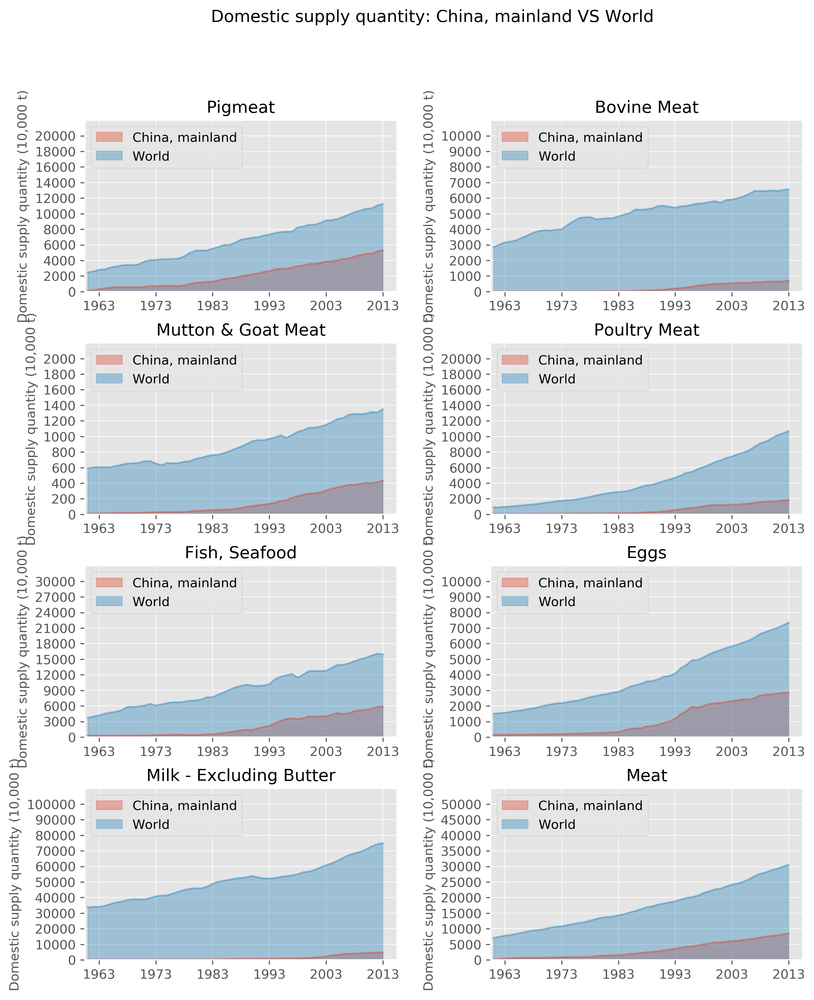

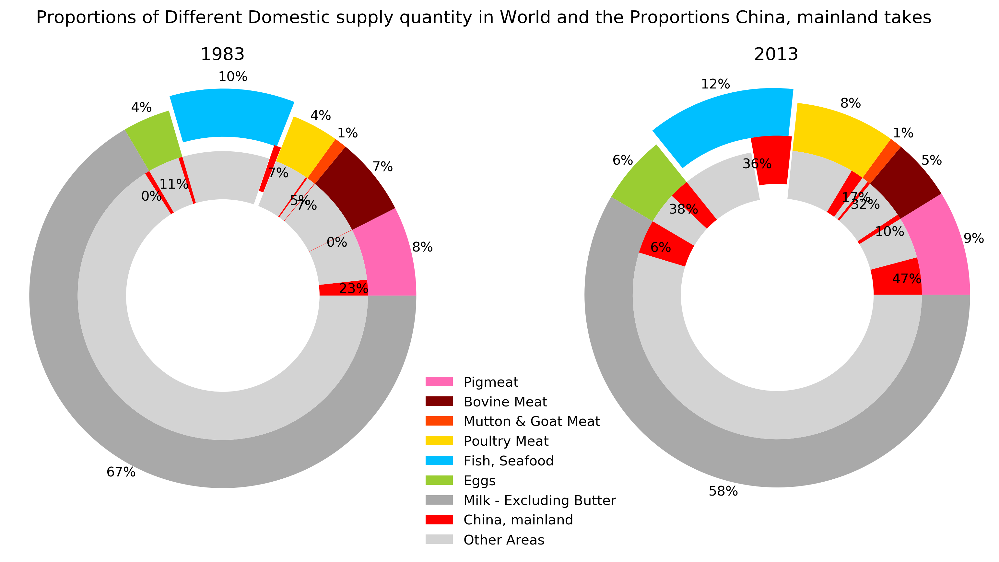

In [47]:
ITEMs_main=['Fish, Seafood']

items=ITEMs.copy()
items.append('Meat')
proportion_AreaToGroup(D,A,E,items=items, toUnit='10,000 t',changeUnit=1/10000, kind='area')

pi_compareAreaToGroup(D,A,E,years=[Years[-1]-30,Years[-1]])

# Part 5. 'Food supply quantity (tonnes)'
**The Data Also Exists in Another Data Set 'FoodSupply_LivestockFish' Which is Exactly the Same as This. We Show it in 'FAO_LivestockFish_FoodSupplyQuantity'. Please Go Ahead There!**

# Part 6. 'Feed'

{'CommodityBalances_LivestockFish': {'China, mainland': {'Production': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Import Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Export Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'M

,Meat,"Fish, Seafood",Milk - Excluding Butter,Animal fats
1963,9.0,99.0,36.0,75.0
1973,8.0,103.0,35.0,51.0
1983,6.0,10.0,25.0,98.0
1993,10.0,2.0,18.0,53.0
2003,8.0,1.0,18.0,88.0
2013,7.0,1.0,13.0,52.0


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_1_World Ranking of Feed in China, mainland.png


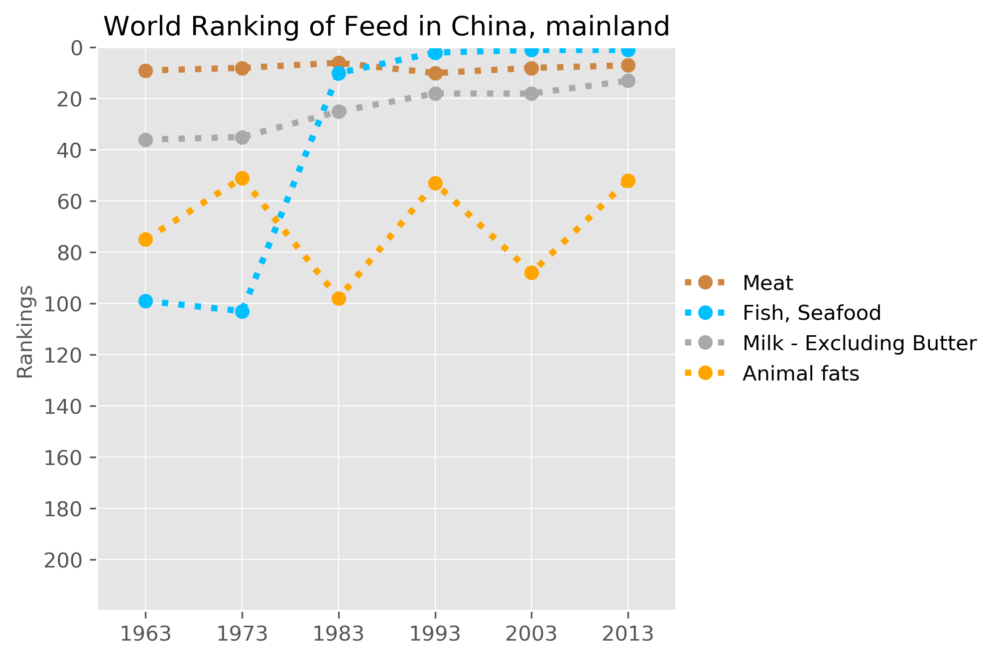

In [50]:
E = 'Feed'

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs_AreaYear[D]={}
PVs_AreaYear[D][A]={}
PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

# for i, pv in PVs_AreaYear[D][A][E].items():
#     display(E, i, pv.tail(2))

# 需要根据结果试调items和颜色
ranking_AreaItemInWorld(D,A,E,items_group='Animal Products',
                        colors=[cmeat,cfish,cmilk,cfat])

,Meat,"Fish, Seafood",Milk - Excluding Butter,Animal fats
Year,,,,
2009,0.0693,810.7915,133.2612,0.0092
2010,0.0715,727.6370,127.6939,0.0079
2011,0.0737,843.3110,133.9727,0.0100
2012,0.0737,863.4255,160.4302,0.0121
2013,0.0737,863.4255,160.8306,0.0121


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_2_a_Trends of Animal Products Feed in China, mainland.png


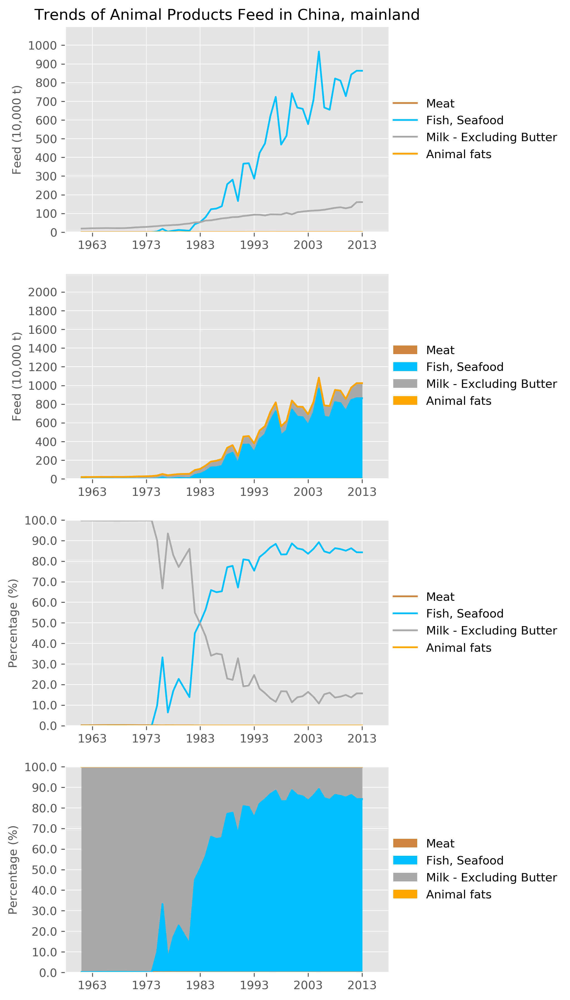

In [51]:
# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cmeat,cfish,cmilk,cfat],
          )

,1993,2013
Area,,
United States of America,1.5802,4.8944
Canada,0.5390,1.5968
Kazakhstan,1.1400,0.8500
Chile,0.3291,0.3808
South Africa,0.0960,0.1620
"China, mainland",0.0500,0.0737


,1993,2013
Area,,
"China, mainland",286.4425,863.4255
Japan,353.8163,170.9305
Norway,85.4534,148.1473
"China, Taiwan Province of",241.4663,93.8096
Indonesia,51.7324,83.1994


,1993,2013
Area,,
India,706.1951,2275.7355
Russian Federation,2667.1153,1066.2572
Uzbekistan,39.2911,412.5074
Ukraine,892.2063,314.9468
Turkey,140.7414,240.0790
"China, mainland",93.5666,160.8306


,1993,2013
Area,,
United States of America,118.1247,125.0000
Spain,13.5358,15.7752
Chile,12.5086,8.9934
"China, Taiwan Province of",4.3775,7.9617
Venezuela (Bolivarian Republic of),7.2995,5.9025
"China, mainland",0.0009,0.0121


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_3_Feed: China, mainland Vs. Top 5 in the World.png


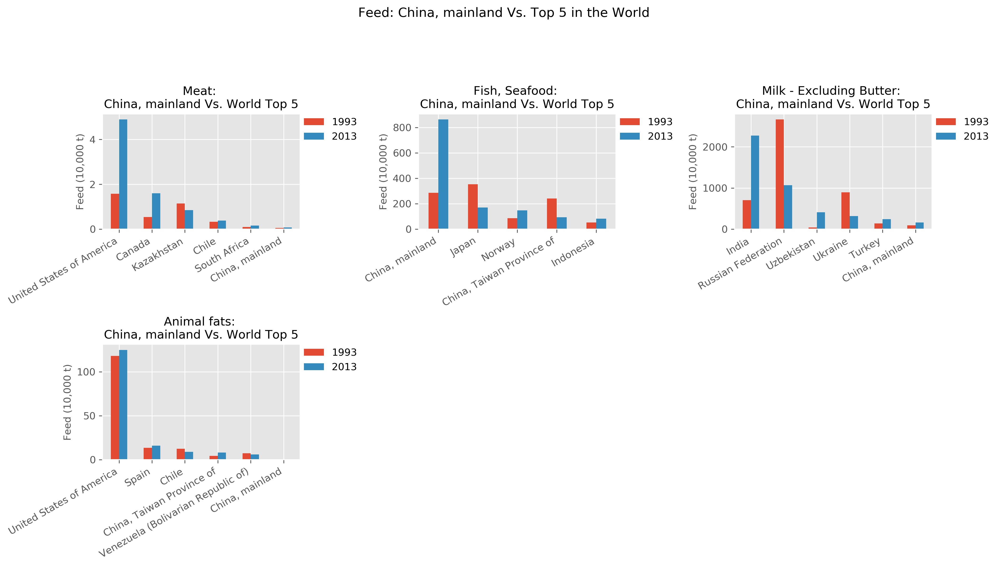

In [52]:
compareToTopAreas(D, A, E, items_group='Animal Products', toUnit='10,000 t', changeUnit=1/10000)

Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_4_Feed: China, mainland VS World.png
1961


,"China, mainland",World,Other Areas
Meat,352.0,3.4442e+04,3.4090e+04
"Fish, Seafood",0.0,9.1073e+06,9.1073e+06
Milk - Excluding Butter,192108.0,9.2036e+07,9.1844e+07
Animal fats,0.0,8.4452e+05,8.4452e+05


2013


,"China, mainland",World,Other Areas
Meat,737.0,8.2495e+04,8.1758e+04
"Fish, Seafood",8634255.0,2.2220e+07,1.3586e+07
Milk - Excluding Butter,1608306.0,8.1974e+07,8.0365e+07
Animal fats,121.0,1.9566e+06,1.9565e+06


Img saved as: ./results/FAO_LivestockFish_CommodityBalance/img/Fig_5_Proportions of Different Feed in World and the Proportions China, mainland takes.png


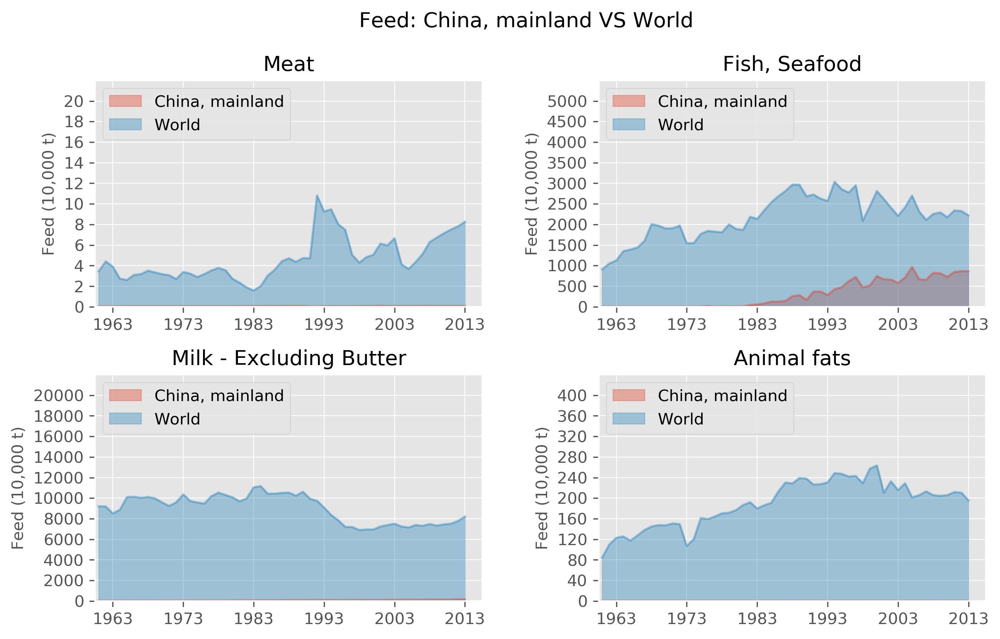

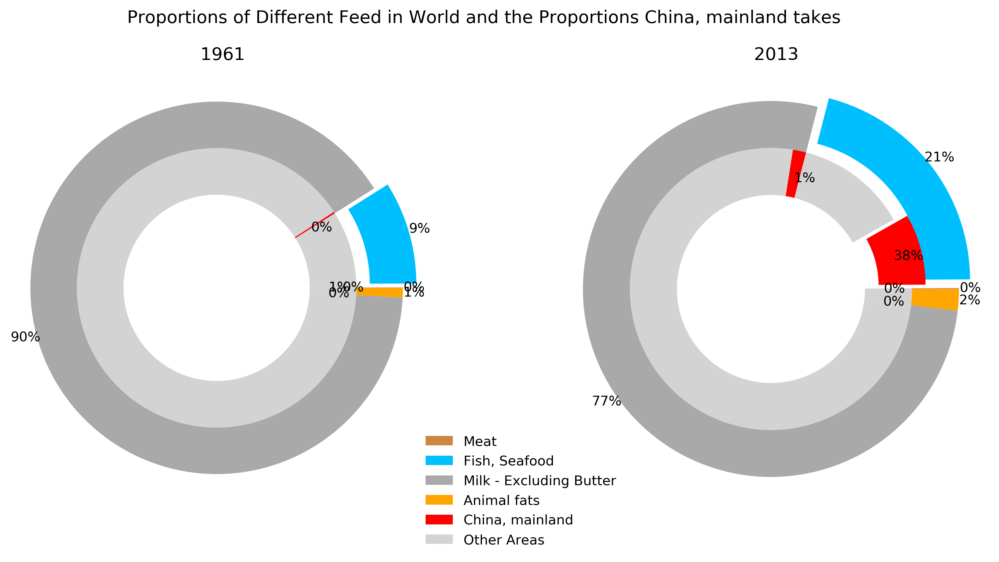

In [53]:
proportion_AreaToGroup(D,A,E, items_group='Animal Products', toUnit='10,000 t', changeUnit=1/10000, kind='area')
pi_compareAreaToGroup(D,A,E,items_group='Animal Products',colors=[cmeat,cfish,cmilk,cfat])

# Part 7. 'Other uses', 'Losses' and so on
**They are so small compare to other aspects, so not considered hear.**

In [57]:
# E = 'Other uses'

# # 生成条件
# CDTs[D][A][E] = Is
# print(CDTs)

# # 生成主要末梢 (所有空值键 + 自定义键)
# items = []
# for i in CDTs[D][A][E]:
#     if CDTs[D][A][E][i]==[]: items.append(i)
# ITEMs=items
# print(ITEMs)

# # 设置 items group, 自动生成最终的 ITEMs
# ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
# print(ITEMs_all)
# items = []
# for i in ITEMs:
#     if i in ITEMs_all: items.append(i)
# ITEMs=items
# print(ITEMs)

# PVs_AreaYear[D]={}
# PVs_AreaYear[D][A]={}
# PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

# for i, pv in PVs_AreaYear[D][A][E].items():
#     display(E, i, pv.tail(2))

# # 需要根据结果试调items和颜色
# ranking_AreaItemInWorld(D,A,E,items_group='Animal Products',rank_max=150,
#                         colors=[cmeat,cfish,cmilk,cfat])

In [56]:
# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cfish,cegg,coffal,cfat,],
#           )

In [54]:
# E = 'Losses'

# # 生成条件
# CDTs[D][A][E] = Is
# print(CDTs)

# # 生成主要末梢 (所有空值键 + 自定义键)
# items = []
# for i in CDTs[D][A][E]:
#     if CDTs[D][A][E][i]==[]: items.append(i)
# ITEMs=items
# print(ITEMs)

# # 设置 items group, 自动生成最终的 ITEMs
# ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
# print(ITEMs_all)
# items = []
# for i in ITEMs:
#     if i in ITEMs_all: items.append(i)
# ITEMs=items
# print(ITEMs)

# PVs_AreaYear[D]={}
# PVs_AreaYear[D][A]={}
# PVs_AreaYear[D][A][E] = mkPVs_forItem_AreaYear(D, A, E, IsGroup)

# for i, pv in PVs_AreaYear[D][A][E].items():
#     display(E, i, pv.tail(2))

# # 需要根据结果试调items和颜色
# ranking_AreaItemInWorld(D,A,E,items_group='Animal Products',rank_max=150,
#                         colors=[cegg,cmilk])

In [55]:
# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cegg,cmilk],
#           )